In [1]:
# Which Countries have had the most significant progression in happiness in 20th century and why?

In [2]:
# Import libraries and options

from scipy import stats
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('whitegrid')
plt.rcParams['font.size'] = 15
plt.rcParams['figure.figsize'] =(10, 7)
plt.rcParams['figure.facecolor'] = '#FFE5B4'

In [3]:
pd.set_option('display.max_rows', None);

In [4]:
# Import data and save originals

original_data_2023 = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\2023\WHR_2023.xls")
data_2023 = pd.DataFrame(original_data_2023)

original_2021 = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\2021\WHR2021.xls")
data_2021 = pd.DataFrame(original_2021)

original_data = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\2023\WHR_before_2023.xls")
data = pd.DataFrame(original_data)

original_country_region = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\country_region.xlsx")
country_region = pd.DataFrame(original_country_region)

original_world_life_expectancy = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\world_life_expectancy.xlsx")
world_life_expectancy = pd.DataFrame(original_world_life_expectancy)

original_taiwan_life_expectancy = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\taiwan_life_expectancy.xlsx")
taiwan_life_expectancy = pd.DataFrame(original_taiwan_life_expectancy)

In [5]:
#### First we will work with data from the current year, 2023
### Prepare data_2023 for analysis

data_2023.head(10)

,Country name,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,7.8042,0.036162,7.875078,7.733322,10.792010,0.968770,71.149994,0.961408,-0.018824,0.181745,1.777825,1.888380,1.584900,0.534574,0.771510,0.126331,0.535299,2.363241
1,Denmark,7.5864,0.041028,7.666815,7.505985,10.962164,0.954112,71.250145,0.933533,0.134242,0.195814,1.777825,1.949406,1.547875,0.537302,0.734416,0.208459,0.525221,2.083766
2,Iceland,7.5296,0.048612,7.624879,7.434321,10.895531,0.982533,72.050018,0.936349,0.210987,0.667848,1.777825,1.925508,1.619666,0.559096,0.738164,0.249635,0.187119,2.250382
3,Israel,7.4729,0.031609,7.534853,7.410946,10.638705,0.943344,72.697205,0.808866,-0.023080,0.708094,1.777825,1.833398,1.520674,0.576730,0.568518,0.124048,0.158292,2.691290
4,Netherlands,7.4030,0.029294,7.460416,7.345583,10.942279,0.930499,71.550018,0.886875,0.212686,0.378929,1.777825,1.942274,1.488228,0.545473,0.672327,0.250547,0.394062,2.110044
5,Sweden,7.3952,0.037362,7.468428,7.321971,10.882823,0.939249,72.150154,0.947971,0.164789,0.202448,1.777825,1.920950,1.510329,0.561825,0.753629,0.224848,0.520469,1.903127
6,Norway,7.3155,0.044143,7.402020,7.228980,11.087730,0.943477,71.500023,0.946616,0.140636,0.282745,1.777825,1.994440,1.521009,0.544111,0.751827,0.211889,0.462955,1.829270
7,Switzerland,7.2401,0.042789,7.323966,7.156234,11.164027,0.920439,72.899956,0.891074,0.026686,0.266348,1.777825,2.021803,1.462816,0.582254,0.677915,0.150750,0.474700,1.869847
8,Luxembourg,7.2279,0.069081,7.363298,7.092502,11.659949,0.878501,71.675003,0.914938,0.023950,0.344978,1.777825,2.199664,1.356879,0.548878,0.709672,0.149281,0.418380,1.845181
9,New Zealand,7.1229,0.038227,7.197824,7.047976,10.661865,0.952398,70.350052,0.886574,0.174828,0.271205,1.777825,1.841704,1.543546,0.512778,0.671927,0.230235,0.471221,1.851519


In [6]:
## Clean data_2023
# Drop unwanted columns

data_2023_columns = ['Country name',
                     'Ladder score',
                     'Logged GDP per capita',
                     'Social support',
                     'Healthy life expectancy',
                     'Freedom to make life choices',
                     'Generosity',
                     'Perceptions of corruption']
data_2023 = data_2023[data_2023_columns]
list(data_2023.columns)

['Country name',
 'Ladder score',
 'Logged GDP per capita',
 'Social support',
 'Healthy life expectancy',
 'Freedom to make life choices',
 'Generosity',
 'Perceptions of corruption']

In [7]:
data_2023 = data_2023.rename(columns = {'Country name':'country_name',
                                      'Ladder score':'happiness_score',
                                      'Logged GDP per capita':'log_gdp_per_capita',
                                      'Social support':'social_support',
                                      'Healthy life expectancy':'life_expectancy',
                                      'Freedom to make life choices':'freedom',
                                      'Generosity':'generosity',
                                      'Perceptions of corruption':'perception_of_corruption'})
list(data_2023.columns)

['country_name',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [8]:
data_2023.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country_name              137 non-null    object 
 1   happiness_score           137 non-null    float64
 2   log_gdp_per_capita        137 non-null    float64
 3   social_support            137 non-null    float64
 4   life_expectancy           136 non-null    float64
 5   freedom                   137 non-null    float64
 6   generosity                137 non-null    float64
 7   perception_of_corruption  137 non-null    float64
dtypes: float64(7), object(1)
memory usage: 8.7+ KB


In [9]:
data_2023.describe()

,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
count,137.000000,137.000000,137.000000,136.000000,137.000000,137.000000,137.000000
mean,5.539755,9.449785,0.799045,64.967627,0.787427,0.022444,0.725375
std,1.139908,1.207315,0.129188,5.750394,0.112350,0.141711,0.176960
min,1.859000,5.526723,0.341341,51.530212,0.381642,-0.254276,0.146112
25%,4.723900,8.590914,0.722042,60.648690,0.723874,-0.073543,0.667848
50%,5.684300,9.567472,0.827064,65.837624,0.800536,0.001419,0.773583
75%,6.333800,10.540300,0.895955,69.412264,0.874468,0.117025,0.845892
max,7.804200,11.659949,0.982533,77.279778,0.961408,0.531386,0.929089


In [10]:
# Check for duplicated rows 

data_2023.duplicated().any()

False

In [11]:
# Check for duplicate country_names

data_2023['country_name'].duplicated().any()

False

In [12]:
# Check for missing data

data_2023[data_2023.isnull().any(axis=1)]

,country_name,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
98,State of Palestine,4.9078,8.716377,0.859495,NaN,0.6945,-0.13237,0.835795


In [13]:
# Insert missing data

data_2023.loc[data_2023['country_name'] == 'State of Palestine', 'life_expectancy'] = 74.2798

In [14]:
# Check for missing data again

data_2023.isnull().sum()

country_name                0
happiness_score             0
log_gdp_per_capita          0
social_support              0
life_expectancy             0
freedom                     0
generosity                  0
perception_of_corruption    0
dtype: int64

In [15]:
## Use country_region to add regions to data_2023, Prepare country_region for merge

country_region.head(10)

,country_name,region,global Cardinal
0,Andorra,Europe,Global North
1,United Arab Emirates,Middle east,Global South
2,Afghanistan,Asia & Pacific,Global South
3,Antigua and Barbuda,South/Latin America,Global South
4,Anguilla,South/Latin America,Global South
5,Albania,Europe,Global North
6,Armenia,Europe,Global North
7,Netherlands Antilles,South/Latin America,Global South
8,Angola,Africa,Global South
9,Antarctica,Asia & Pacific,Global South


In [16]:
# Drop unwanted columns from country_region dataframe

country_region = country_region.drop(['global Cardinal'], axis=1)
list(country_region.columns)

['country_name', 'region']

In [17]:
# Order by country_name and reset index

country_region = country_region.sort_values('country_name').reset_index().drop('index', axis=1)
country_region.head(10)

,country_name,region
0,Afghanistan,Asia & Pacific
1,Aland Islands,Europe
2,Albania,Europe
3,Algeria,Arab States
4,American Samoa,Asia & Pacific
5,Andorra,Europe
6,Angola,Africa
7,Anguilla,South/Latin America
8,Antarctica,Asia & Pacific
9,Antigua and Barbuda,South/Latin America


In [18]:
# Create copy to work on

test_data_2023 = data_2023

In [19]:
## Merge test_data_2023 with country_region to add region

test_data_2023 = pd.merge(test_data_2023, country_region, how = 'left', on = 'country_name')
data_2023_columns = ['country_name',
                     'region', 
                     'happiness_score',
                     'log_gdp_per_capita',
                     'social_support',
                     'life_expectancy',
                     'freedom',
                     'generosity',
                     'perception_of_corruption']
test_data_2023 = test_data_2023[data_2023_columns]
test_data_2023.head(10)

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Finland,Europe,7.8042,10.792010,0.968770,71.149994,0.961408,-0.018824,0.181745
1,Denmark,Europe,7.5864,10.962164,0.954112,71.250145,0.933533,0.134242,0.195814
2,Iceland,Europe,7.5296,10.895531,0.982533,72.050018,0.936349,0.210987,0.667848
3,Israel,Middle east,7.4729,10.638705,0.943344,72.697205,0.808866,-0.023080,0.708094
4,Netherlands,Europe,7.4030,10.942279,0.930499,71.550018,0.886875,0.212686,0.378929
5,Sweden,Europe,7.3952,10.882823,0.939249,72.150154,0.947971,0.164789,0.202448
6,Norway,Europe,7.3155,11.087730,0.943477,71.500023,0.946616,0.140636,0.282745
7,Switzerland,Europe,7.2401,11.164027,0.920439,72.899956,0.891074,0.026686,0.266348
8,Luxembourg,Europe,7.2279,11.659949,0.878501,71.675003,0.914938,0.023950,0.344978
9,New Zealand,Asia & Pacific,7.1229,10.661865,0.952398,70.350052,0.886574,0.174828,0.271205


In [20]:
# Check for NaN region

test_data_2023['region'].isna().any()

True

In [21]:
# Locate NaN rows

test_data_2023[test_data_2023.isnull().any(axis=1)][['country_name','region']]

,country_name,region
17,Czechia,NaN
26,Taiwan Province of China,NaN
33,Kosovo,NaN
56,South Korea,NaN
62,Moldova,NaN
69,Russia,NaN
81,Hong Kong S.A.R. of China,NaN
85,Congo (Brazzaville),NaN
86,North Macedonia,NaN
88,Laos,NaN


In [22]:
test_data_2023.sort_values('country_name')

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
136,Afghanistan,Asia & Pacific,1.8590,7.324032,0.341341,54.712410,0.381642,-0.081011,0.847215
82,Albania,Europe,5.2773,9.567472,0.717909,69.150070,0.794328,-0.006932,0.878094
80,Algeria,Arab States,5.3291,9.300214,0.855219,66.549232,0.571240,-0.117374,0.716906
51,Argentina,South/Latin America,6.0237,9.958788,0.890890,67.200081,0.822678,-0.089480,0.814013
78,Armenia,Europe,5.3417,9.614713,0.790231,67.788971,0.795605,-0.155315,0.705434
11,Australia,Asia & Pacific,7.0946,10.821049,0.933870,71.049942,0.890200,0.197561,0.495916
10,Austria,Europe,7.0973,10.898906,0.888436,71.150047,0.854737,0.101604,0.496774
41,Bahrain,Arab States,6.1732,10.775782,0.843845,65.824997,0.943973,0.117025,0.736699
117,Bangladesh,Asia & Pacific,4.2821,8.684880,0.544469,64.548424,0.845008,0.005050,0.698185
16,Belgium,Europe,6.8591,10.843587,0.914871,70.899086,0.825229,0.001419,0.548573


In [23]:
country_region.sort_values('country_name')

,country_name,region
0,Afghanistan,Asia & Pacific
1,Aland Islands,Europe
2,Albania,Europe
3,Algeria,Arab States
4,American Samoa,Asia & Pacific
5,Andorra,Europe
6,Angola,Africa
7,Anguilla,South/Latin America
8,Antarctica,Asia & Pacific
9,Antigua and Barbuda,South/Latin America


In [24]:
country_region.shape

(248, 2)

In [25]:
# Correct NaN rows

test_data_2023.loc[test_data_2023['country_name'] == 'Czechia', 'country_name'] = 'Czech Republic'
test_data_2023.loc[test_data_2023['country_name'] == 'Taiwan Province of China', 'country_name'] = 'Taiwan'
test_data_2023.loc[test_data_2023['country_name'] == 'Hong Kong S.A.R. of China', 'country_name'] = 'Hong Kong'
test_data_2023.loc[test_data_2023['country_name'] == 'Congo (Kinshasa)', 'country_name'] = 'Congo Kinshasa'
test_data_2023.loc[test_data_2023['country_name'] == 'Congo (Brazzaville)', 'country_name'] = 'Congo Brazzaville'
test_data_2023.loc[test_data_2023['country_name'] == 'North Macedonia', 'country_name'] = 'Macedonia'
test_data_2023.loc[test_data_2023['country_name'] == 'Ivory Coast', 'country_name'] = '''Côte D'Ivoire'''
test_data_2023.loc[test_data_2023['country_name'] == 'State of Palestine', 'country_name'] = 'Palestine'

country_region.loc[117, 'country_name'] = 'South Korea'
country_region.loc[145, 'country_name'] = 'Moldova'
country_region.loc[121, 'country_name'] = 'Laos'
country_region.loc[country_region['country_name'] == 'Russian Federation', 'country_name'] = 'Russia'
country_region.loc[country_region['country_name'] == 'Congo, The Democratic Republic of the', 'country_name'] = 'Congo Kinshasa'
country_region.loc[country_region['country_name'] == 'Congo', 'country_name'] = 'Congo Brazzaville'
country_region.loc[country_region['country_name'] == 'Palestinian Territory', 'country_name'] = 'Palestine'
country_region.loc[country_region['country_name'] == 'Iran, Islamic Republic of', 'country_name'] = 'Iran'
country_region.loc[country_region['country_name'] == 'Turkey', 'country_name'] = 'Turkiye'
country_region.loc[country_region['country_name'] == 'Tanzania, United Republic of', 'country_name'] = 'Tanzania'

country_region.loc[248] = ['Kosovo', 'Europe']

In [26]:
## Merge again

test_data_2023 = test_data_2023.rename(columns = {'region' : 'region_2'})
test_data_2023 = pd.merge(test_data_2023, country_region, how = 'left', on = 'country_name')
test_data_2023 = test_data_2023[data_2023_columns]
test_data_2023.sort_values('country_name')

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
136,Afghanistan,Asia & Pacific,1.8590,7.324032,0.341341,54.712410,0.381642,-0.081011,0.847215
82,Albania,Europe,5.2773,9.567472,0.717909,69.150070,0.794328,-0.006932,0.878094
80,Algeria,Arab States,5.3291,9.300214,0.855219,66.549232,0.571240,-0.117374,0.716906
51,Argentina,South/Latin America,6.0237,9.958788,0.890890,67.200081,0.822678,-0.089480,0.814013
78,Armenia,Europe,5.3417,9.614713,0.790231,67.788971,0.795605,-0.155315,0.705434
11,Australia,Asia & Pacific,7.0946,10.821049,0.933870,71.049942,0.890200,0.197561,0.495916
10,Austria,Europe,7.0973,10.898906,0.888436,71.150047,0.854737,0.101604,0.496774
41,Bahrain,Arab States,6.1732,10.775782,0.843845,65.824997,0.943973,0.117025,0.736699
117,Bangladesh,Asia & Pacific,4.2821,8.684880,0.544469,64.548424,0.845008,0.005050,0.698185
16,Belgium,Europe,6.8591,10.843587,0.914871,70.899086,0.825229,0.001419,0.548573


In [27]:
# Check for NaN region again

test_data_2023['region'].isna().any()

False

In [28]:
# Check proper regions were entered

print(test_data_2023.drop_duplicates('region', keep='first')['region'])

0                    Europe
3               Middle east
9            Asia & Pacific
12            North America
22      South/Latin America
39    South/Central America
41              Arab States
58                   Africa
Name: region, dtype: object


In [29]:
# Check for missing data

test_data_2023.isnull().sum()

country_name                0
region                      0
happiness_score             0
log_gdp_per_capita          0
social_support              0
life_expectancy             0
freedom                     0
generosity                  0
perception_of_corruption    0
dtype: int64

In [30]:
# Sort by country_name and reset index

test_data_2023 = test_data_2023.sort_values('country_name').reset_index().drop('index', axis=1)
test_data_2023.head(10)

,country_name,region,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,1.8590,7.324032,0.341341,54.712410,0.381642,-0.081011,0.847215
1,Albania,Europe,5.2773,9.567472,0.717909,69.150070,0.794328,-0.006932,0.878094
2,Algeria,Arab States,5.3291,9.300214,0.855219,66.549232,0.571240,-0.117374,0.716906
3,Argentina,South/Latin America,6.0237,9.958788,0.890890,67.200081,0.822678,-0.089480,0.814013
4,Armenia,Europe,5.3417,9.614713,0.790231,67.788971,0.795605,-0.155315,0.705434
5,Australia,Asia & Pacific,7.0946,10.821049,0.933870,71.049942,0.890200,0.197561,0.495916
6,Austria,Europe,7.0973,10.898906,0.888436,71.150047,0.854737,0.101604,0.496774
7,Bahrain,Arab States,6.1732,10.775782,0.843845,65.824997,0.943973,0.117025,0.736699
8,Bangladesh,Asia & Pacific,4.2821,8.684880,0.544469,64.548424,0.845008,0.005050,0.698185
9,Belgium,Europe,6.8591,10.843587,0.914871,70.899086,0.825229,0.001419,0.548573


In [31]:
### Save dataframe, data_2023 is ready for analysis

data_2023 = test_data_2023

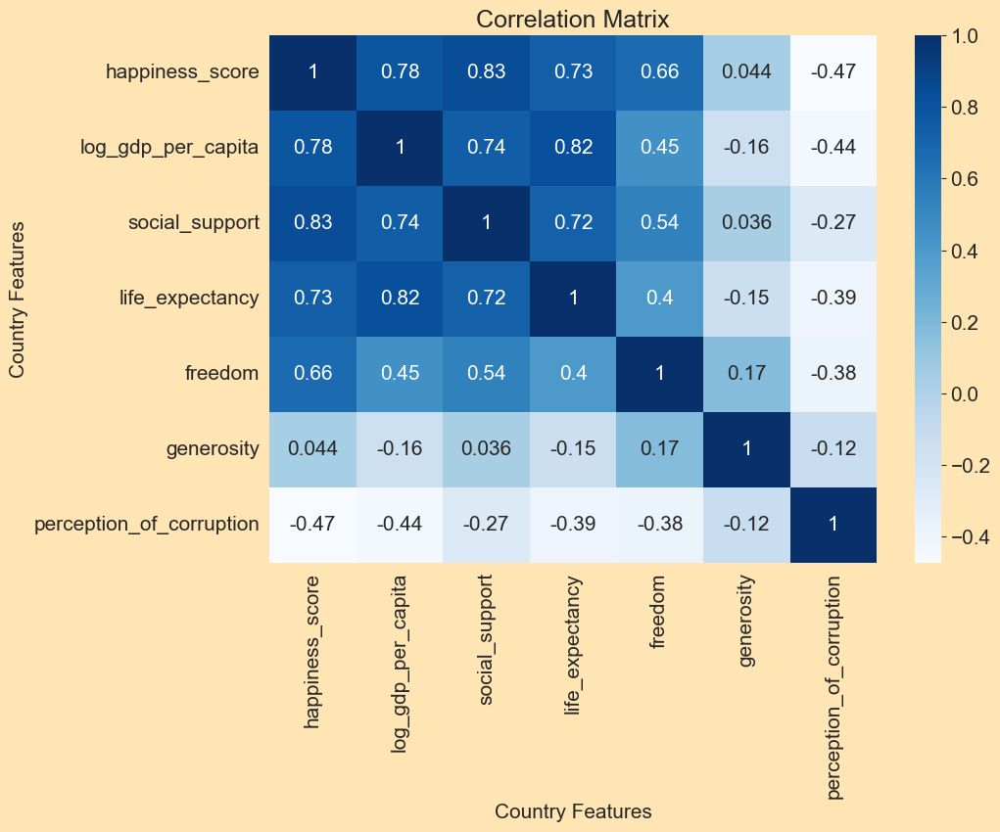

In [32]:
### What country feature correlates with happiness?

corr = data_2023.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

# Shows that Country Features with the highest correlation to happiness are: log_gdp_per_capita, healthy_life_expectancy, and social_support

In [33]:
correlation_matrix = data_2023.corr(numeric_only = True)
corr_unstack = correlation_matrix.unstack().sort_values()
data_2023_high_corr = corr_unstack.sort_values()
data_2023_high_corr = data_2023_high_corr[(data_2023_high_corr) < 1]
data_2023_high_corr = data_2023_high_corr[(data_2023_high_corr) > 0.5]
data_2023_high_corr

freedom             social_support        0.541808
social_support      freedom               0.541808
happiness_score     freedom               0.662922
freedom             happiness_score       0.662922
social_support      life_expectancy       0.723622
life_expectancy     social_support        0.723622
                    happiness_score       0.732440
happiness_score     life_expectancy       0.732440
social_support      log_gdp_per_capita    0.738087
log_gdp_per_capita  social_support        0.738087
happiness_score     log_gdp_per_capita    0.784368
log_gdp_per_capita  happiness_score       0.784368
                    life_expectancy       0.821225
life_expectancy     log_gdp_per_capita    0.821225
social_support      happiness_score       0.834623
happiness_score     social_support        0.834623
dtype: float64

In [34]:
data_2023_high_corr = pd.DataFrame(data_2023_high_corr).reset_index().sort_values('level_0')
data_2023_high_corr

,level_0,level_1,0
0,freedom,social_support,0.541808
3,freedom,happiness_score,0.662922
2,happiness_score,freedom,0.662922
7,happiness_score,life_expectancy,0.732440
10,happiness_score,log_gdp_per_capita,0.784368
15,happiness_score,social_support,0.834623
5,life_expectancy,social_support,0.723622
6,life_expectancy,happiness_score,0.732440
13,life_expectancy,log_gdp_per_capita,0.821225
9,log_gdp_per_capita,social_support,0.738087


In [35]:
data_2023_high_corr.drop_duplicates(subset=0, keep="first").sort_values(0, ascending=False).rename(columns = {0:'correlation_coefficient'})

# Shows that Country Features with the highest correlation to happiness are: social_support, log_gdp_per_capita, and life_expectancy in that order.

,level_0,level_1,correlation_coefficient
15,happiness_score,social_support,0.834623
13,life_expectancy,log_gdp_per_capita,0.821225
10,happiness_score,log_gdp_per_capita,0.784368
9,log_gdp_per_capita,social_support,0.738087
7,happiness_score,life_expectancy,0.732440
5,life_expectancy,social_support,0.723622
3,freedom,happiness_score,0.662922
0,freedom,social_support,0.541808


In [36]:
## Plot Data
# Order legend

legend = data_2023.groupby('region')['happiness_score'].count().reset_index().sort_values('happiness_score', ascending = False)['region'].tolist()

Text(0, 0.5, 'Social Support')

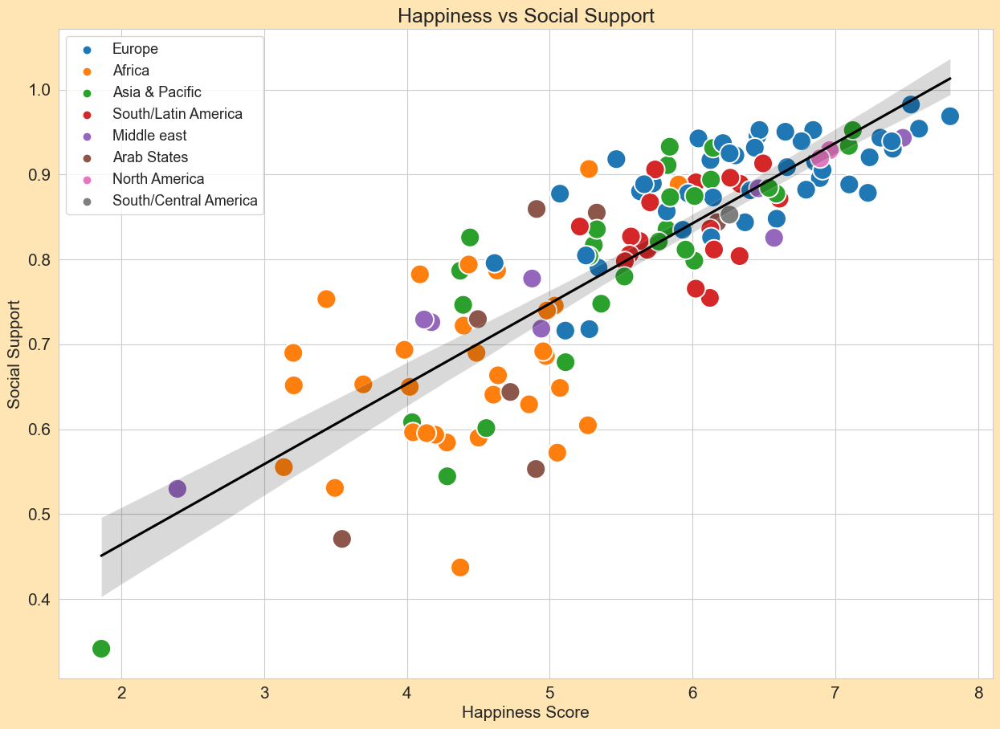

In [37]:
# Plot happiness_score and social_support

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Social Support')
ax = happ_gdp_corr = sns.scatterplot(x = data_2023.happiness_score,
                                     y = data_2023.social_support,
                                     hue_order = legend, 
                                     hue = data_2023['region'], 
                                     s = 300)
sns.regplot(data=data_2023, 
            x="happiness_score",
            y="social_support",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Social Support')

Text(0, 0.5, 'Log GDP per Capita')

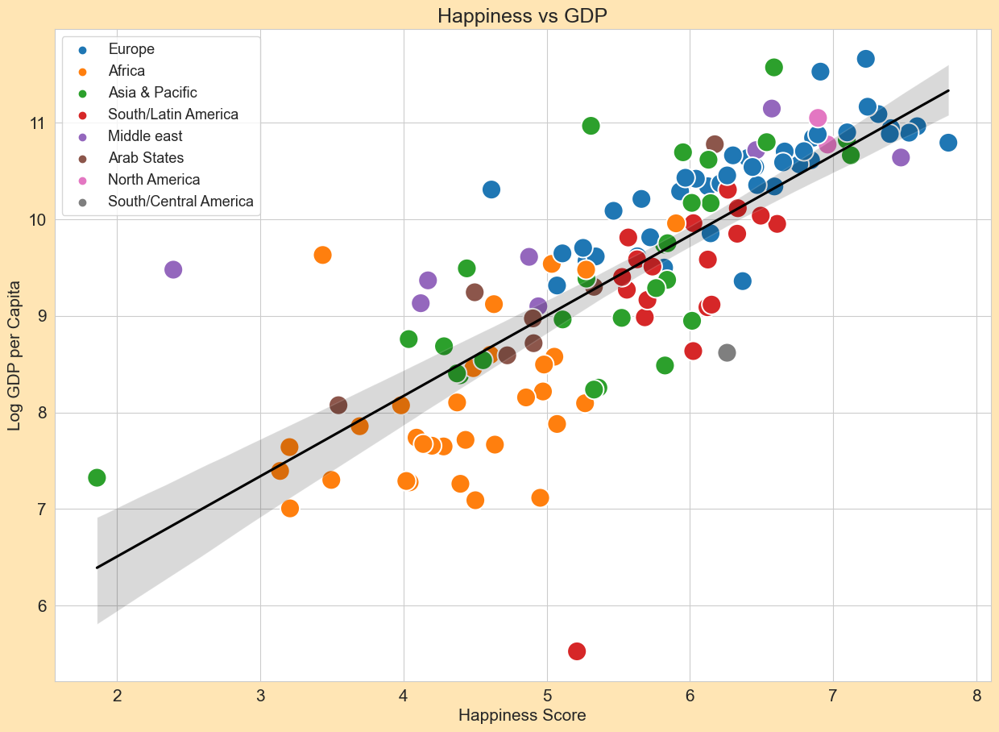

In [38]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = data_2023.happiness_score,
                                     y = data_2023.log_gdp_per_capita, 
                                     hue_order = legend, 
                                     hue = data_2023['region'], 
                                     s = 300)
sns.regplot(data=data_2023, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

Text(0, 0.5, 'Life Expectancy')

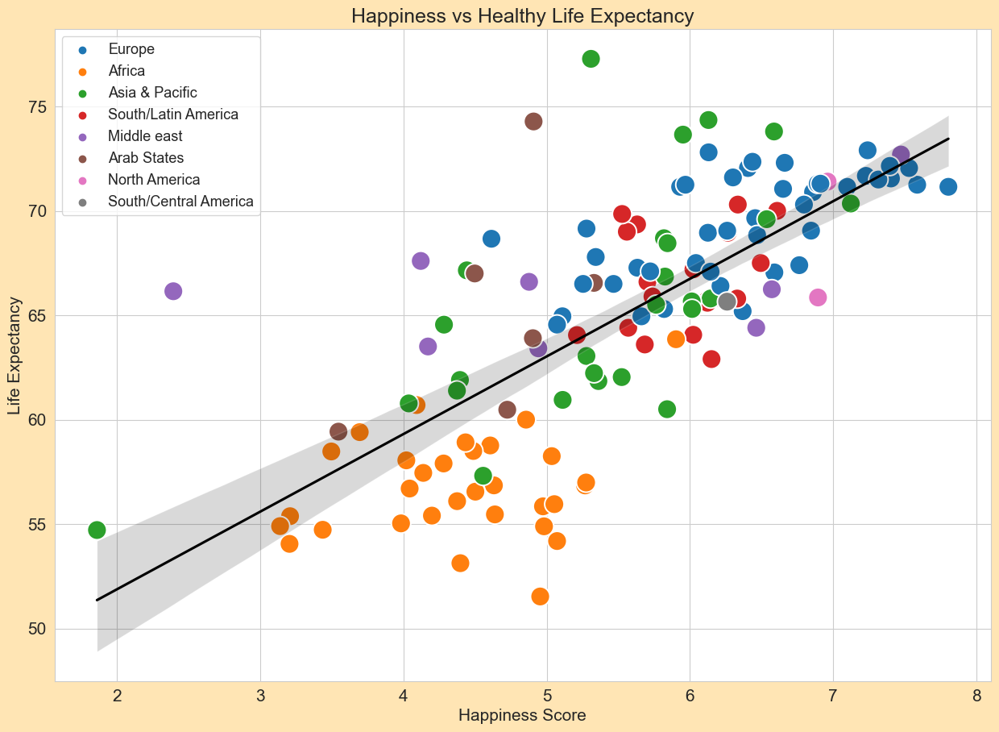

In [39]:
# Plot happiness_score and healthy_life_expectancy

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs Healthy Life Expectancy')
ax = happ_gdp_corr = sns.scatterplot(x = data_2023.happiness_score,
                                     y = data_2023.life_expectancy, 
                                     hue_order = legend, 
                                     hue = data_2023['region'], 
                                     s = 300)
sns.regplot(data=data_2023, 
            x="happiness_score",
            y="life_expectancy",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Life Expectancy')

In [40]:
# Now we work on the main data from all previous availble years (Before 2023) to prepare to merge.

data.head(10)

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,0.414297,0.258195
1,Afghanistan,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,0.481421,0.237092
2,Afghanistan,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,0.516907,0.275324
3,Afghanistan,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,0.479835,0.267175
4,Afghanistan,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,0.613513,0.267919
5,Afghanistan,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204,0.547417,0.273328
6,Afghanistan,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,0.491641,0.374861
7,Afghanistan,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,0.491410,0.339276
8,Afghanistan,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,0.501409,0.348332
9,Afghanistan,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393,0.435270,0.371326


In [41]:
# Drop unwanted columns

data = data.drop(['Positive affect', 'Negative affect'], axis=1)

In [42]:
# Rename columns

data = data.rename(columns = {'Country name':'country_name',
                              'Life Ladder':'happiness_score',
                              'Log GDP per capita':'log_gdp_per_capita',
                              'Social support':'social_support',
                              'Healthy life expectancy at birth':'life_expectancy',
                              'Freedom to make life choices':'freedom',
                              'Generosity':'generosity',
                              'Perceptions of corruption':'perception_of_corruption'})
list(data.columns)

['country_name',
 'year',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [43]:
## Use country_region to add regions to data
# Create copy to work on

test_data = data

In [44]:
# Merge with country_region to add region

test_data = pd.merge(test_data, country_region, how = 'left', on = 'country_name')
data_columns = ['country_name',
                'region',
                'year',
                'happiness_score',
                'log_gdp_per_capita',
                'social_support',
                'life_expectancy',
                'freedom',
                'generosity',
                'perception_of_corruption']
test_data = test_data[data_columns]
test_data.head(10)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [45]:
test_data_country_region = test_data[['country_name','region']].drop_duplicates()
test_data_country_region

,country_name,region
0,Afghanistan,Asia & Pacific
14,Albania,Europe
29,Algeria,Arab States
39,Angola,Africa
43,Argentina,South/Latin America
60,Armenia,Europe
76,Australia,Asia & Pacific
92,Austria,Europe
107,Azerbaijan,Asia & Pacific
121,Bahrain,Arab States


In [46]:
test_data_country_region.shape

(165, 2)

In [47]:
# Check for NaN region

test_data_country_region['region'].isna().any()

True

In [48]:
# Locate NaN rows

test_data_country_region[test_data_country_region.isnull().any(axis=1)]

,country_name,region
421,Congo (Brazzaville),NaN
434,Congo (Kinshasa),NaN
491,Czechia,NaN
793,Hong Kong S.A.R. of China,NaN
943,Ivory Coast,NaN
1458,North Macedonia,NaN
1755,Somaliland region,NaN
1828,State of Palestine,NaN
1878,Syria,NaN
1885,Taiwan Province of China,NaN


In [49]:
country_region

,country_name,region
0,Afghanistan,Asia & Pacific
1,Aland Islands,Europe
2,Albania,Europe
3,Algeria,Arab States
4,American Samoa,Asia & Pacific
5,Andorra,Europe
6,Angola,Africa
7,Anguilla,South/Latin America
8,Antarctica,Asia & Pacific
9,Antigua and Barbuda,South/Latin America


In [50]:
# Correct NaN rows

test_data.loc[test_data['country_name'] == 'Congo (Brazzaville)', 'country_name'] = 'Congo Brazzaville'
test_data.loc[test_data['country_name'] == 'Congo (Kinshasa)', 'country_name'] = 'Congo Kinshasa'
test_data.loc[test_data['country_name'] == 'Czechia', 'country_name'] = 'Czech Republic'
test_data.loc[test_data['country_name'] == 'Hong Kong S.A.R. of China', 'country_name'] = 'Hong Kong'
test_data.loc[test_data['country_name'] == 'Ivory Coast', 'country_name'] = '''Côte D'Ivoire'''
test_data.loc[test_data['country_name'] == 'North Macedonia', 'country_name'] = 'Macedonia'
test_data.loc[test_data['country_name'] == 'Somaliland region', 'country_name'] = 'Somaliland'
test_data.loc[test_data['country_name'] == 'State of Palestine', 'country_name'] = 'Palestine'
test_data.loc[test_data['country_name'] == 'Taiwan Province of China', 'country_name'] = 'Taiwan'

country_region.loc[country_region['country_name'] == 'Syrian Arab Republic', 'country_name'] = 'Syria'

country_region.loc[249] = ['Somaliland', 'Africa']


In [51]:
# Merge again

test_data = test_data.rename(columns = {'region' : 'region_2'})
test_data = pd.merge(test_data, country_region, how = 'left', on = 'country_name')
test_data = test_data[data_columns]
test_data.head(30)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [52]:
# Check for NaN region again

test_data['region'].isna().any()

False

In [53]:
# Save dataframe

data = test_data

In [54]:
## Prepare data for analysis
# Check for duplicated rows 

test_data = data

test_data.duplicated().any()

False

In [55]:
# Check for missing data

test_data.isnull().sum()

country_name                  0
region                        0
year                          0
happiness_score               0
log_gdp_per_capita           20
social_support               13
life_expectancy              54
freedom                      33
generosity                   73
perception_of_corruption    116
dtype: int64

In [56]:
# Locate missing data in life_expectancy column

test_data[test_data['life_expectancy'].isnull() == True][['country_name', 'year', 'life_expectancy']]

,country_name,year,life_expectancy
793,Hong Kong,2006,NaN
794,Hong Kong,2008,NaN
795,Hong Kong,2009,NaN
796,Hong Kong,2010,NaN
797,Hong Kong,2011,NaN
798,Hong Kong,2012,NaN
799,Hong Kong,2014,NaN
800,Hong Kong,2016,NaN
801,Hong Kong,2017,NaN
802,Hong Kong,2019,NaN


In [57]:
# Fill in missing life_expectancy for Hong Kong and Kosovo with data from ourworldindata.org

world_life_expectancy.head(10)

,Data Source,World Development Indicators,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 57,Unnamed: 58,Unnamed: 59,Unnamed: 60,Unnamed: 61,Unnamed: 62,Unnamed: 63,Unnamed: 64,Unnamed: 65,Unnamed: 66
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Last Updated Date,2023-09-19 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Country Name,Country Code,Indicator Name,Indicator Code,1960.000000,1961.000000,1962.000000,1963.000000,1964.000000,1965.000000,...,2013.000000,2014.000000,2015.000000,2016.000000,2017.000000,2018.000000,2019.000000,2020.000000,2021.000000,2022.0
4,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,64.152000,64.537000,64.752000,65.132000,65.294000,65.502000,...,75.636000,75.601000,75.683000,75.617000,75.903000,76.072000,76.248000,75.723000,74.626000,NaN
5,Africa Eastern and Southern,AFE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,44.085552,44.386697,44.752182,44.913159,45.479043,45.498338,...,60.709870,61.337917,61.856458,62.444050,62.922390,63.365863,63.755678,63.313860,62.454590,NaN
6,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.535000,33.068000,33.547000,34.016000,34.494000,34.953000,...,62.417000,62.545000,62.659000,63.136000,63.016000,63.081000,63.565000,62.575000,61.982000,NaN
7,Africa Western and Central,AFW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,37.845152,38.164950,38.735102,39.063715,39.335360,39.618038,...,55.673406,55.922229,56.195872,56.581678,56.888446,57.189139,57.555796,57.226373,56.988657,NaN
8,Angola,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,38.211000,37.267000,37.539000,37.824000,38.131000,38.495000,...,59.307000,60.040000,60.655000,61.092000,61.680000,62.144000,62.448000,62.261000,61.643000,NaN
9,Albania,ALB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,54.439000,55.634000,56.671000,57.844000,58.983000,60.019000,...,78.123000,78.407000,78.644000,78.860000,79.047000,79.184000,79.282000,76.989000,76.463000,NaN


In [58]:
# CLean world_life_expectancy for use

world_life_expectancy = world_life_expectancy.drop(world_life_expectancy.index[[0, 1, 2]]).reset_index().drop('index', axis=1)

new_header = world_life_expectancy.iloc[0].to_list()
world_life_expectancy = world_life_expectancy[1:]
world_life_expectancy.columns = new_header

In [59]:
world_life_expectancy.head(10)

,Country Name,Country Code,Indicator Name,Indicator Code,1960.0,1961.0,1962.0,1963.0,1964.0,1965.0,...,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0,2021.0,2022.0
1,Aruba,ABW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,64.152000,64.537000,64.752000,65.132000,65.294000,65.502000,...,75.636000,75.601000,75.683000,75.617000,75.903000,76.072000,76.248000,75.723000,74.626000,NaN
2,Africa Eastern and Southern,AFE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,44.085552,44.386697,44.752182,44.913159,45.479043,45.498338,...,60.709870,61.337917,61.856458,62.444050,62.922390,63.365863,63.755678,63.313860,62.454590,NaN
3,Afghanistan,AFG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,32.535000,33.068000,33.547000,34.016000,34.494000,34.953000,...,62.417000,62.545000,62.659000,63.136000,63.016000,63.081000,63.565000,62.575000,61.982000,NaN
4,Africa Western and Central,AFW,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,37.845152,38.164950,38.735102,39.063715,39.335360,39.618038,...,55.673406,55.922229,56.195872,56.581678,56.888446,57.189139,57.555796,57.226373,56.988657,NaN
5,Angola,AGO,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,38.211000,37.267000,37.539000,37.824000,38.131000,38.495000,...,59.307000,60.040000,60.655000,61.092000,61.680000,62.144000,62.448000,62.261000,61.643000,NaN
6,Albania,ALB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,54.439000,55.634000,56.671000,57.844000,58.983000,60.019000,...,78.123000,78.407000,78.644000,78.860000,79.047000,79.184000,79.282000,76.989000,76.463000,NaN
7,Andorra,AND,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Arab World,ARB,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,44.972899,45.676401,46.122576,46.972472,47.895758,48.232107,...,70.196514,70.492629,70.758222,70.943062,71.429596,71.633017,71.844626,70.923360,70.814483,NaN
9,United Arab Emirates,ARE,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,48.811000,49.695000,50.686000,51.584000,52.848000,53.985000,...,78.853000,79.044000,79.223000,79.335000,79.504000,79.627000,79.726000,78.946000,78.710000,NaN
10,Argentina,ARG,"Life expectancy at birth, total (years)",SP.DYN.LE00.IN,63.978000,64.360000,64.244000,64.449000,64.363000,64.593000,...,76.491000,76.755000,76.760000,76.308000,76.833000,76.999000,77.284000,75.892000,75.390000,NaN


In [60]:
# Drop unnecessary columns

world_life_expectancy_columns = ['Country Name',2005.0,
                                                 2006.0,
                                                 2007.0,
                                                 2008.0,
                                                 2009.0,
                                                 2010.0,
                                                 2011.0,
                                                 2012.0,
                                                 2013.0,
                                                 2014.0,
                                                 2015.0,
                                                 2016.0,
                                                 2017.0,
                                                 2018.0,
                                                 2019.0,
                                                 2020.0,
                                                 2021.0,
                                                 2022.0]
world_life_expectancy = world_life_expectancy[world_life_expectancy_columns]
list(world_life_expectancy.columns)

['Country Name',
 2005.0,
 2006.0,
 2007.0,
 2008.0,
 2009.0,
 2010.0,
 2011.0,
 2012.0,
 2013.0,
 2014.0,
 2015.0,
 2016.0,
 2017.0,
 2018.0,
 2019.0,
 2020.0,
 2021.0,
 2022.0]

In [61]:
# Rename Columns

world_life_expectancy = world_life_expectancy.rename(columns = {'Country Name' : 'country_name',
                                                                2005.0 : 2005,
                                                                2006.0 : 2006,
                                                                2007.0 : 2007,
                                                                2008.0 : 2008,
                                                                2009.0 : 2009,
                                                                2010.0 : 2010,
                                                                2011.0 : 2011,
                                                                2012.0 : 2012,
                                                                2013.0 : 2013,
                                                                2014.0 : 2014,
                                                                2015.0 : 2015,
                                                                2016.0 : 2016,
                                                                2017.0 : 2017,
                                                                2018.0 : 2018,
                                                                2019.0 : 2019,
                                                                2020.0 : 2020,
                                                                2021.0 : 2021,
                                                                2022.0 : 2022})
list(world_life_expectancy.columns)

['country_name',
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016,
 2017,
 2018,
 2019,
 2020,
 2021,
 2022]

In [62]:
# Melt world_life_expectancy to match format of data_2

melted_world_life_expectancy = pd.melt(world_life_expectancy, id_vars=['country_name'], var_name='year', value_name='life_expectancy')
world_life_expectancy = melted_world_life_expectancy.sort_values(['country_name','year']).reset_index().drop('index', axis=1)
world_life_expectancy.head(10)

,country_name,year,life_expectancy
0,Afghanistan,2005,58.361
1,Afghanistan,2006,58.684
2,Afghanistan,2007,59.111
3,Afghanistan,2008,59.852
4,Afghanistan,2009,60.364
5,Afghanistan,2010,60.851
6,Afghanistan,2011,61.419
7,Afghanistan,2012,61.923
8,Afghanistan,2013,62.417
9,Afghanistan,2014,62.545


In [63]:
# Check table for NaN rows

world_life_expectancy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4788 entries, 0 to 4787
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country_name     4788 non-null   object 
 1   year             4788 non-null   object 
 2   life_expectancy  4383 non-null   float64
dtypes: float64(1), object(2)
memory usage: 112.3+ KB


In [64]:
# Drop NaN rows

world_life_expectancy = world_life_expectancy[world_life_expectancy['life_expectancy'].isna() == False].reset_index().drop('index', axis =1)

world_life_expectancy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4383 entries, 0 to 4382
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   country_name     4383 non-null   object 
 1   year             4383 non-null   object 
 2   life_expectancy  4383 non-null   float64
dtypes: float64(1), object(2)
memory usage: 102.9+ KB


In [65]:
# Rename column to avoid duplicates during merge.
# Rename country_name to match data_2

world_life_expectancy = world_life_expectancy.rename(columns = {'life_expectancy' : 'life_expectancy_new'})

world_life_expectancy.loc[world_life_expectancy['country_name'] == 'Hong Kong SAR, China', 'country_name'] = 'Hong Kong'

In [66]:
# Merge world_life_expectancy with data_2

merge = pd.merge(test_data,world_life_expectancy, how = 'left', on = ['country_name','year'])
merge.head(30)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,life_expectancy_new
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,59.852
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,60.364
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,60.851
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,61.419
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,61.923
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204,62.417
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,62.545
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,62.659
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,63.136
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393,63.016


In [67]:
merge[(merge['life_expectancy'].isna() == True) & (merge['life_expectancy_new'].isna() == False)][['country_name','year', 'life_expectancy', 'life_expectancy_new']]

,country_name,year,life_expectancy,life_expectancy_new
793,Hong Kong,2006,NaN,82.375610
794,Hong Kong,2008,NaN,82.375610
795,Hong Kong,2009,NaN,82.775610
796,Hong Kong,2010,NaN,82.978049
797,Hong Kong,2011,NaN,83.421951
798,Hong Kong,2012,NaN,83.480488
799,Hong Kong,2014,NaN,83.980488
800,Hong Kong,2016,NaN,84.226829
801,Hong Kong,2017,NaN,84.680488
802,Hong Kong,2019,NaN,85.180488


In [68]:
# Replace life_expectancy of Hong Kong and Kosovo with new data

merge['life_expectancy'] = merge['life_expectancy'].combine_first(merge['life_expectancy_new'])
merge[merge['country_name'].isin (['Hong Kong', 'Kosovo']) == True][['country_name','year', 'life_expectancy', 'life_expectancy_new']]

,country_name,year,life_expectancy,life_expectancy_new
793,Hong Kong,2006,82.375610,82.375610
794,Hong Kong,2008,82.375610,82.375610
795,Hong Kong,2009,82.775610,82.775610
796,Hong Kong,2010,82.978049,82.978049
797,Hong Kong,2011,83.421951,83.421951
798,Hong Kong,2012,83.480488,83.480488
799,Hong Kong,2014,83.980488,83.980488
800,Hong Kong,2016,84.226829,84.226829
801,Hong Kong,2017,84.680488,84.680488
802,Hong Kong,2019,85.180488,85.180488


In [69]:
# Drop life_expectancy_new and save as data_2

test_data = merge.drop('life_expectancy_new', axis=1)
test_data = test_data[data_columns]
test_data.head(10)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [70]:
# Check for remaining NaN rows

test_data[test_data['life_expectancy'].isna() == True][['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1046,Kosovo,2022,NaN
1755,Somaliland,2009,NaN
1756,Somaliland,2010,NaN
1757,Somaliland,2011,NaN
1758,Somaliland,2012,NaN
1833,Palestine,2011,NaN
1834,Palestine,2012,NaN
1835,Palestine,2013,NaN
1836,Palestine,2014,NaN
1837,Palestine,2015,NaN


In [71]:
# Fill in missing life_expectancy for Taiwan with data from macrotrends.net

taiwan_life_expectancy

,year,life_expectancy_new
0,2022,80.87
1,2021,80.70
2,2020,80.53
3,2019,80.36
4,2018,80.19
5,2017,80.00
6,2016,79.82
7,2015,79.63
8,2014,79.45
9,2013,79.26


In [72]:
# Add country_name column 

taiwan_life_expectancy['country_name'] = 'Taiwan'
taiwan_life_expectancy

,year,life_expectancy_new,country_name
0,2022,80.87,Taiwan
1,2021,80.70,Taiwan
2,2020,80.53,Taiwan
3,2019,80.36,Taiwan
4,2018,80.19,Taiwan
5,2017,80.00,Taiwan
6,2016,79.82,Taiwan
7,2015,79.63,Taiwan
8,2014,79.45,Taiwan
9,2013,79.26,Taiwan


In [73]:
# Merge data_2 with taiwan_life_expectancy

merge = pd.merge(test_data, taiwan_life_expectancy, how='left', on = ['country_name','year'])
merge

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,life_expectancy_new
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,NaN
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,NaN
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,NaN
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,NaN
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,NaN
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204,NaN
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,NaN
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,NaN
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,NaN
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393,NaN


In [74]:
# Set life_expectancy for Taiwan to NaN so it can be updated

merge.loc[merge['country_name'] == 'Taiwan', 'life_expectancy'] = np.NaN

In [75]:
# Replace life_expectancy of Taiwan with new data

merge['life_expectancy'] = merge['life_expectancy'].combine_first(merge['life_expectancy_new'])
merge[merge['country_name'] == 'Taiwan'] [['country_name','year','life_expectancy','life_expectancy_new']]

,country_name,year,life_expectancy,life_expectancy_new
1885,Taiwan,2006,77.69,77.69
1886,Taiwan,2008,78.19,78.19
1887,Taiwan,2010,78.62,78.62
1888,Taiwan,2011,78.83,78.83
1889,Taiwan,2012,79.05,79.05
1890,Taiwan,2013,79.26,79.26
1891,Taiwan,2014,79.45,79.45
1892,Taiwan,2015,79.63,79.63
1893,Taiwan,2016,79.82,79.82
1894,Taiwan,2017,80.00,80.00


In [76]:
# Drop life_expectancy_new and save as data_2

test_data = merge.drop('life_expectancy_new', axis=1)
test_data = test_data[data_columns].sort_values(['country_name','year']).reset_index().drop('index', axis=1)
test_data.head(10)

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393


In [77]:
# Check for remaining NaN rows

test_data[test_data['life_expectancy'].isna() == True][['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1046,Kosovo,2022,NaN
1507,Palestine,2011,NaN
1508,Palestine,2012,NaN
1509,Palestine,2013,NaN
1510,Palestine,2014,NaN
1511,Palestine,2015,NaN
1512,Palestine,2016,NaN
1513,Palestine,2017,NaN
1514,Palestine,2018,NaN
1515,Palestine,2019,NaN


In [78]:
# Enter life_expectancy for Kosovo 2022 and Palestine manually

test_data.loc[1046, 'life_expectancy'] = 79.5237
test_data.loc[1502, 'life_expectancy'] = 71.92
test_data.loc[1503, 'life_expectancy'] = 72.15
test_data.loc[1504, 'life_expectancy'] = 72.41
test_data.loc[1505, 'life_expectancy'] = 72.61
test_data.loc[1506, 'life_expectancy'] = 73.00
test_data.loc[1507, 'life_expectancy'] = 73.24
test_data.loc[1508, 'life_expectancy'] = 73.47
test_data.loc[1509, 'life_expectancy'] = 74.03
test_data.loc[1510, 'life_expectancy'] = 72.62
test_data.loc[1511, 'life_expectancy'] = 74.41
test_data.loc[1512, 'life_expectancy'] = 74.55
test_data.loc[1513, 'life_expectancy'] = 74.83
test_data.loc[1514, 'life_expectancy'] = 74.79
test_data.loc[1515, 'life_expectancy'] = 75.24
test_data.loc[1516, 'life_expectancy'] = 75.40

test_data[test_data['country_name'] == 'Palestine'] [['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1502,Palestine,2006,71.92
1503,Palestine,2007,72.15
1504,Palestine,2008,72.41
1505,Palestine,2009,72.61
1506,Palestine,2010,73.00
1507,Palestine,2011,73.24
1508,Palestine,2012,73.47
1509,Palestine,2013,74.03
1510,Palestine,2014,72.62
1511,Palestine,2015,74.41


In [79]:
# The rest of the missing data is not easily availble and will be left as is

test_data[test_data['life_expectancy'].isna() == True][['country_name','year','life_expectancy']]

,country_name,year,life_expectancy
1770,Somaliland,2009,NaN
1771,Somaliland,2010,NaN
1772,Somaliland,2011,NaN
1773,Somaliland,2012,NaN


In [80]:
# Check for NaN rows in data_2
# The rest of the missing data is not easily availble and will be left as is

test_data.isnull().sum()

country_name                  0
region                        0
year                          0
happiness_score               0
log_gdp_per_capita           20
social_support               13
life_expectancy               4
freedom                      33
generosity                   73
perception_of_corruption    116
dtype: int64

In [81]:
# Save progress on data_2 as data

data = test_data

In [82]:
###################################

In [83]:
## Combine data_2023 and data
# Create duplicates

test_data = data
test_data_2023 = data_2023

# Check that columns names are the same

print(test_data.shape, test_data_2023.shape)

(2199, 10) (137, 9)


In [84]:
list(test_data.columns)

['country_name',
 'region',
 'year',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [85]:
list(test_data_2023.columns)

['country_name',
 'region',
 'happiness_score',
 'log_gdp_per_capita',
 'social_support',
 'life_expectancy',
 'freedom',
 'generosity',
 'perception_of_corruption']

In [86]:
# Add year column to data_2023

test_data_2023['year'] = 2023

In [87]:
test_data = pd.concat([data, test_data_2023])
print(test_data.shape, test_data[test_data['year'] == 2023].shape, test_data[test_data['year'] != 2023].shape)

(2336, 10) (137, 10) (2199, 10)


In [88]:
# Reset index and save as data

data = test_data.reset_index().drop('index', axis=1)

In [89]:
#Find outliers in data

test_data = data

In [90]:
test_data.groupby('year')['happiness_score'].mean().reset_index()

,year,happiness_score
0,2005,6.446164
1,2006,5.196935
2,2007,5.418291
3,2008,5.418554
4,2009,5.457640
5,2010,5.496782
6,2011,5.424088
7,2012,5.443612
8,2013,5.393302
9,2014,5.386267


In [91]:
# Find countries with an unusually low amount of reports.

test_data_n_reports_country = test_data.groupby('country_name')['happiness_score'].count().to_frame('n_reports').reset_index()
test_data_n_reports_country

,country_name,n_reports
0,Afghanistan,15
1,Albania,16
2,Algeria,11
3,Angola,4
4,Argentina,18
5,Armenia,17
6,Australia,17
7,Austria,16
8,Azerbaijan,14
9,Bahrain,12


In [92]:
n_reports_std = test_data_n_reports_country['n_reports'].std()
n_reports_mean = test_data_n_reports_country['n_reports'].mean()
print(n_reports_mean, n_reports_std, n_reports_std * 2)

14.157575757575758 4.811003033128803 9.622006066257606


In [93]:
test_data_n_reports_country['within_2_std'] = test_data_n_reports_country['n_reports'].between(n_reports_mean - (n_reports_std * 2), n_reports_mean + (n_reports_std * 2))

In [94]:
# Countries with an unusually low amount of reports, may be excluded due to skew 

test_data_n_reports_country[test_data_n_reports_country['within_2_std'] == False]

,country_name,n_reports,within_2_std
3,Angola,4,False
13,Belize,2,False
15,Bhutan,3,False
36,Cuba,1,False
41,Djibouti,4,False
47,Eswatini,3,False
59,Guyana,1,False
83,Lesotho,4,False
92,Maldives,1,False
112,Oman,1,False


In [95]:
#plot
test_data = data

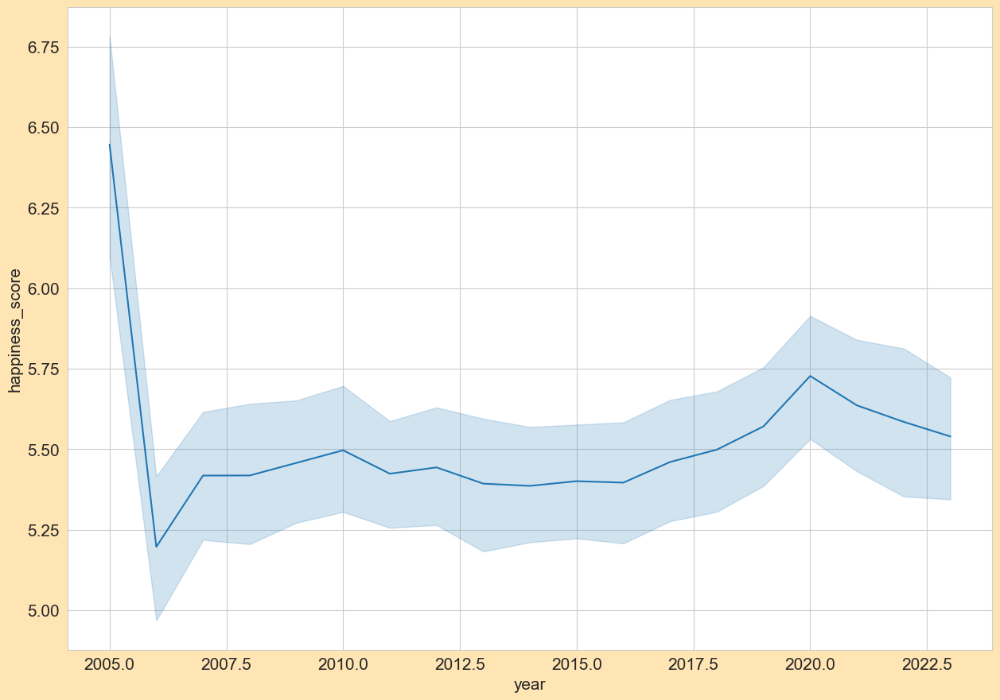

In [96]:
sns.lineplot(data=test_data, x='year',y='happiness_score')
plt.show()

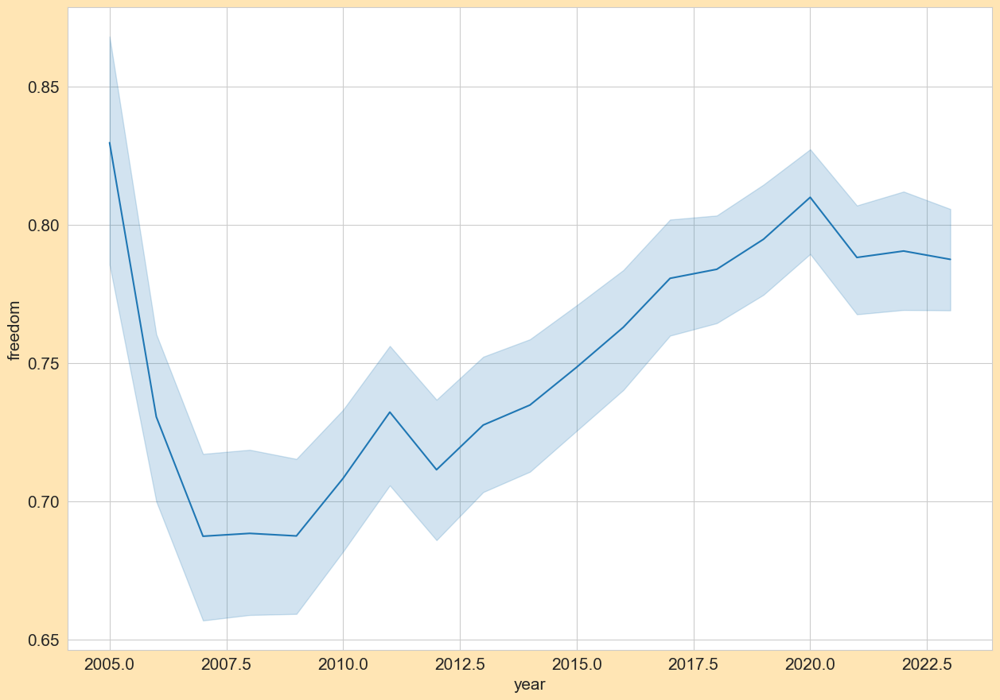

In [97]:
sns.lineplot(data=test_data, x='year',y='freedom')
plt.show()

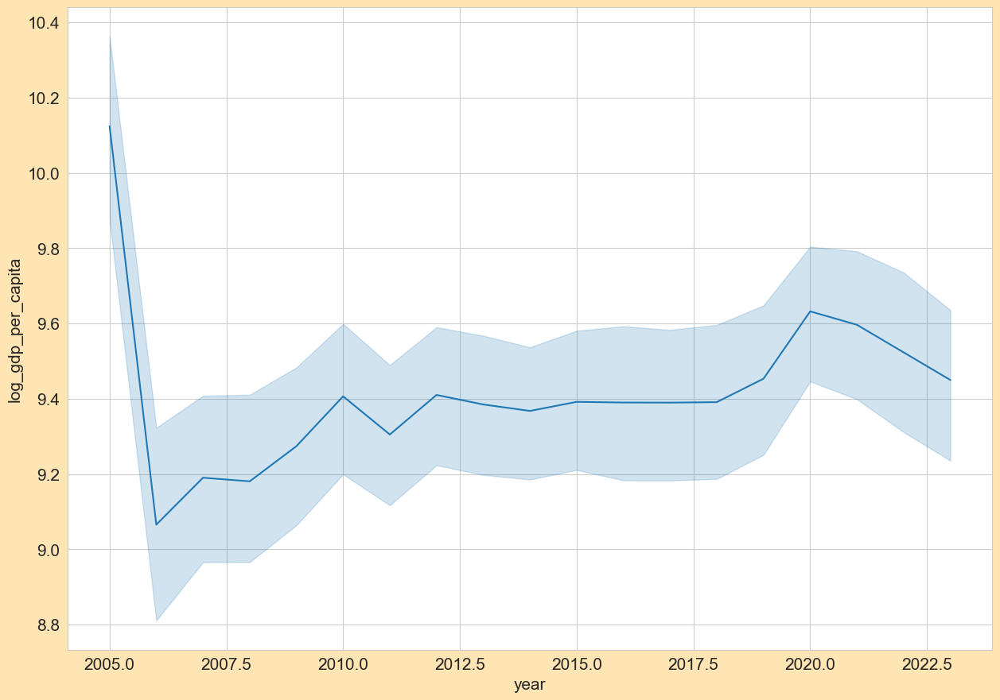

In [98]:
sns.lineplot(data=test_data, x='year',y='log_gdp_per_capita')
plt.show()

In [99]:
## Which countries had the largest increase or decrease in happiness score since 2007

In [100]:
test_data_n_reports_year = test_data.groupby('year')['happiness_score'].count().to_frame('n_reports').reset_index()
test_data_n_reports_year

,year,n_reports
0,2005,27
1,2006,89
2,2007,102
3,2008,110
4,2009,114
5,2010,124
6,2011,146
7,2012,141
8,2013,136
9,2014,144


Text(0, 0.5, 'Log GDP per Capita')

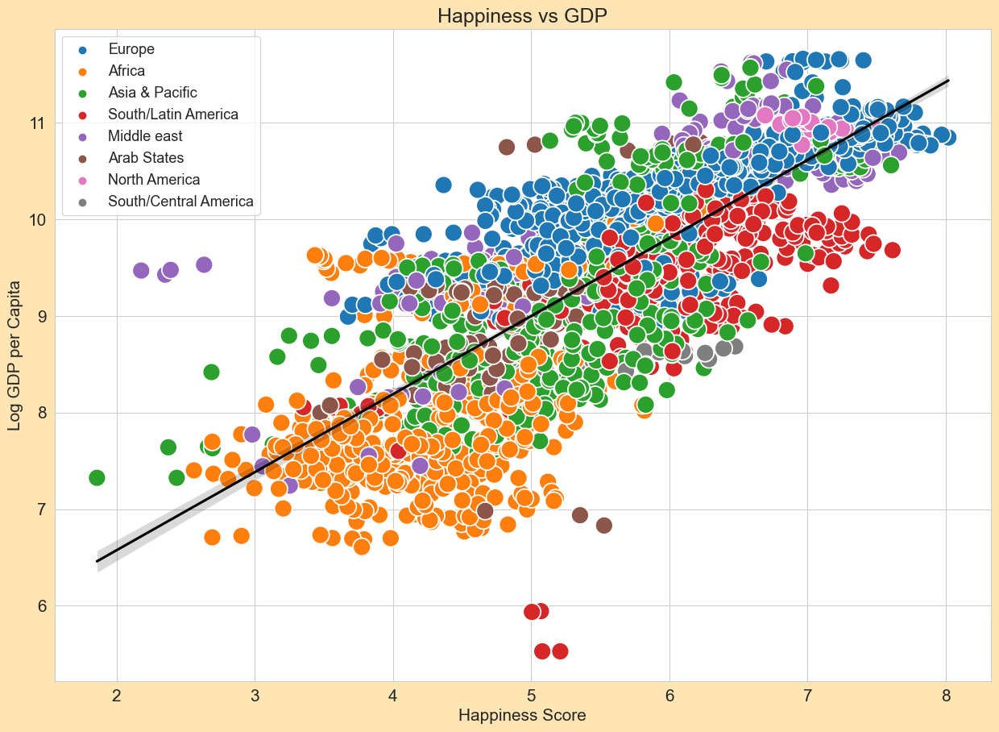

In [101]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita, 
                                     hue_order = ['Europe',
                                                  'Africa',
                                                  'Asia & Pacific',
                                                  'South/Latin America',
                                                  'Middle east',
                                                  'Arab States',
                                                  'North America',
                                                  'South/Central America'], 
                                     hue = data['region'], 
                                     s = 250)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

Text(0, 0.5, 'Log GDP per Capita')

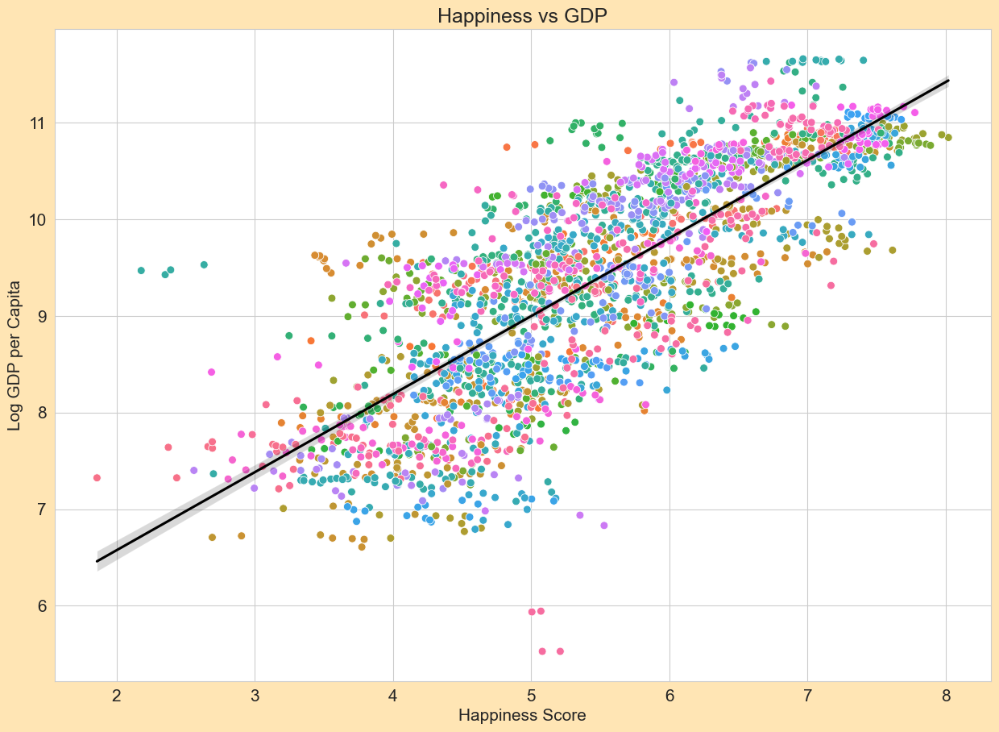

In [102]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita,
                                     hue = data['country_name'], 
                                     s = 50)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

ax.get_legend().remove()
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

Text(0, 0.5, 'Log GDP per Capita')

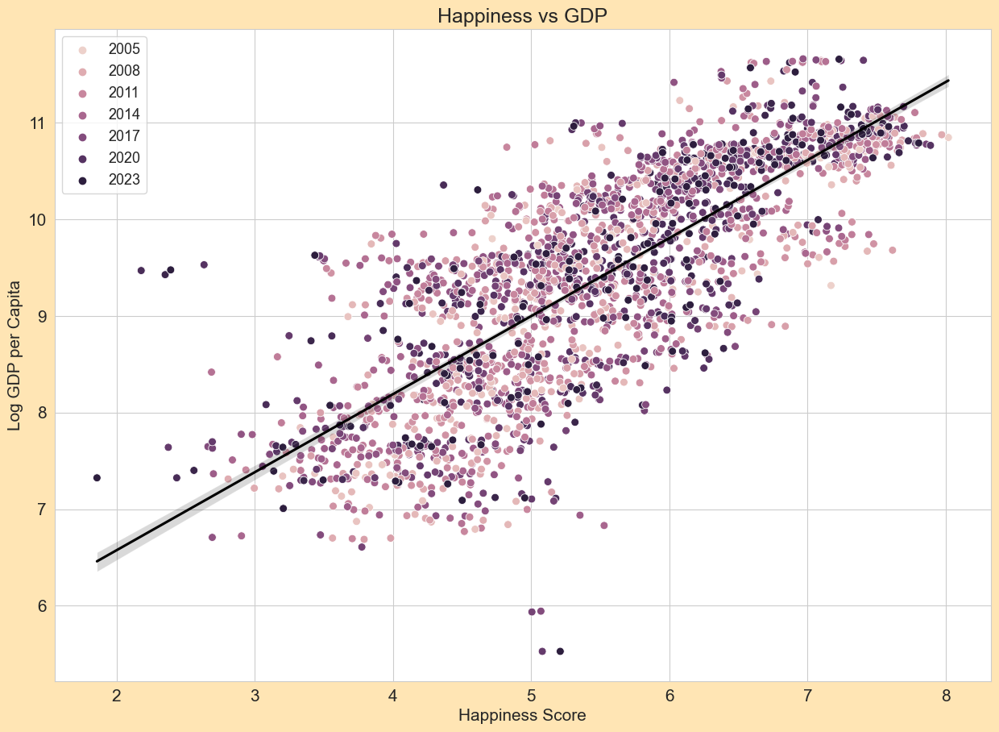

In [103]:
# Plot happiness_score and log_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = test_data.happiness_score,
                                     y = test_data.log_gdp_per_capita,
                                     hue = data['year'], 
                                     s = 50)
sns.regplot(data=test_data, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

<Axes: xlabel='year', ylabel='happiness_score'>

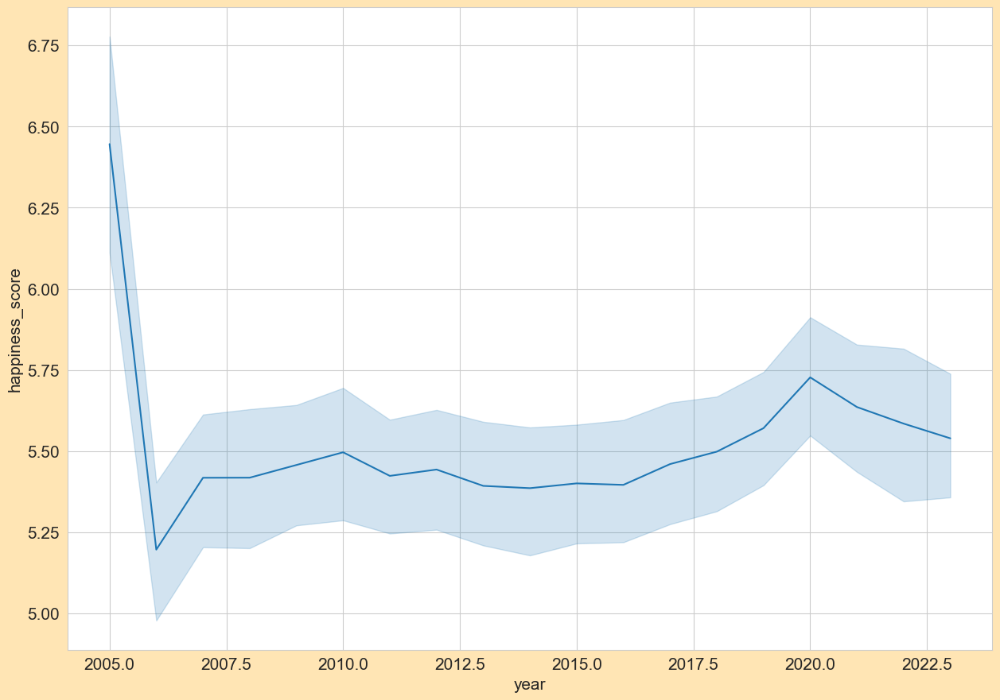

In [104]:
sns.lineplot(x = test_data.year, 
             y = test_data.happiness_score)


In [105]:
###############

In [106]:
test_data_pivot = pd.pivot(test_data, index='year', columns='country_name', values='happiness_score')

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_17396\1586914393.py:1: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  test_data_pivot = pd.pivot(test_data, index='year', columns='country_name', values='happiness_score')


In [107]:
test_data_pivot

country_name,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,...,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
2005,NaN,NaN,NaN,NaN,NaN,NaN,7.340688,NaN,NaN,NaN,...,NaN,6.983557,NaN,NaN,NaN,7.169621,NaN,NaN,NaN,NaN
2006,NaN,NaN,NaN,NaN,6.312925,4.289311,NaN,7.122211,4.727871,NaN,...,6.734222,NaN,7.181794,5.785868,5.232322,6.525146,5.293660,NaN,4.824455,3.826268
2007,NaN,4.634252,NaN,NaN,6.073158,4.881516,7.285391,NaN,4.568160,NaN,...,NaN,6.801931,7.512688,5.693946,NaN,NaN,5.421688,4.477133,3.998293,3.280247
2008,3.723590,NaN,NaN,NaN,5.961034,4.651972,7.253757,7.180954,4.817189,NaN,...,NaN,6.986464,7.280386,5.663870,5.311368,6.257771,5.480425,NaN,4.730263,3.174264
2009,4.401778,5.485470,NaN,NaN,6.424133,4.177582,NaN,NaN,4.573725,5.700523,...,6.866063,6.906547,7.158032,6.296223,5.260721,7.188803,5.304265,4.809259,5.260361,4.055914
2010,4.758381,5.268937,5.463567,NaN,6.441067,4.367811,7.450047,7.302679,4.218611,5.936869,...,7.097456,7.029364,7.163616,6.062011,5.095342,7.478455,5.295781,4.350313,NaN,4.681570
2011,3.831719,5.867422,5.317194,5.589001,6.775805,4.260491,7.405616,7.470513,4.680470,4.823976,...,7.118701,6.869249,7.115139,6.554047,5.738744,6.579789,5.767344,3.746256,4.999114,4.845642
2012,3.782938,5.510124,5.604596,4.360250,6.468387,4.319712,7.195586,7.400689,4.910772,5.027187,...,7.217767,6.880784,7.026227,6.449728,6.019332,7.066577,5.534570,4.060601,5.013375,4.955101
2013,3.572100,4.550648,NaN,3.937107,6.582260,4.277191,7.364169,7.498803,5.481178,6.689711,...,6.620951,6.918055,7.249285,6.444465,5.939986,6.552796,5.022699,4.217679,5.243996,4.690188


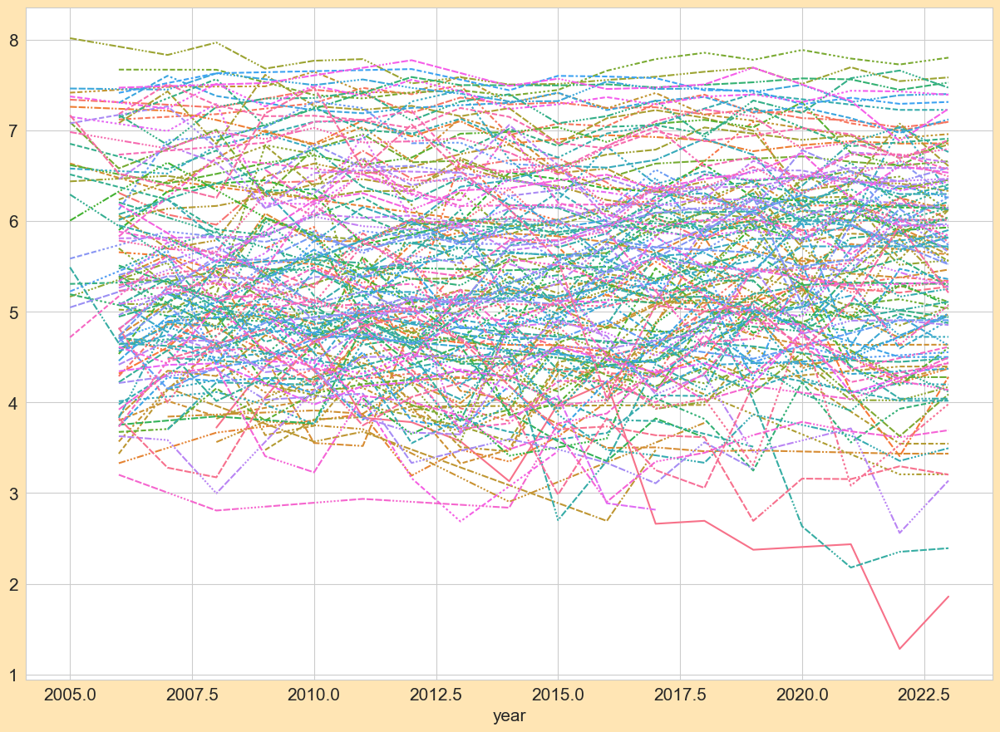

In [108]:
sns.lineplot(data=test_data_pivot)

plt.legend([],[], frameon=False)

In [109]:
####################

In [110]:
test_data_2 = test_data[['country_name', 'year', 'happiness_score']].sort_values(['country_name','year'])

In [111]:
test_data_2 = test_data_2.reset_index().drop('index', axis=1)

In [112]:
# Find the difference between 2 consecutive years by country

test_data_2['diff']=test_data_2.groupby(['country_name',test_data_2['year'].diff().ne(1).cumsum()])['happiness_score'].diff(1)
test_data_2.head(20)

,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,0.678188
2,Afghanistan,2010,4.758381,0.356603
3,Afghanistan,2011,3.831719,-0.926662
4,Afghanistan,2012,3.782938,-0.048782
5,Afghanistan,2013,3.572100,-0.210837
6,Afghanistan,2014,3.130896,-0.441205
7,Afghanistan,2015,3.982855,0.851959
8,Afghanistan,2016,4.220169,0.237314
9,Afghanistan,2017,2.661718,-1.558450


In [113]:
top_1year_index = test_data_2.sort_values('diff', ascending = False).head(5).index.tolist()
bottom_1year_index = test_data_2.sort_values('diff', ascending = True).head(5).index.tolist()

In [114]:
top_1year_index

[132, 627, 2315, 614, 246]

In [115]:
bottom_1year_index

[629, 1196, 2316, 9, 2264]

In [116]:
a = top_1year_index
a = [x - 1 for x in a]
a

[131, 626, 2314, 613, 245]

In [117]:
top_1year_index = top_1year_index + a
top_1year_index.sort()
top_1year_index

[131, 132, 245, 246, 613, 614, 626, 627, 2314, 2315]

In [118]:
top_1year = test_data_2.iloc[top_1year_index].reset_index().drop('index', axis=1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,0.203211
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,-0.033099
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,-0.645637
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,-0.104041
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,-0.734692
9,Zambia,2020,4.837992,1.531196


In [119]:


top_1year['diff'] = top_1year['happiness_score'] - top_1year.groupby('country_name')['happiness_score'].shift(1)
top_1year

,country_name,year,happiness_score,diff
0,Bahrain,2012,5.027187,NaN
1,Bahrain,2013,6.689711,1.662524
2,Botswana,2011,3.519921,NaN
3,Botswana,2012,4.835939,1.316018
4,Egypt,2013,3.558520,NaN
5,Egypt,2014,4.885073,1.326552
6,El Salvador,2008,5.191494,NaN
7,El Salvador,2009,6.839087,1.647593
8,Zambia,2019,3.306797,NaN
9,Zambia,2020,4.837992,1.531196


<Axes: xlabel='year', ylabel='happiness_score'>

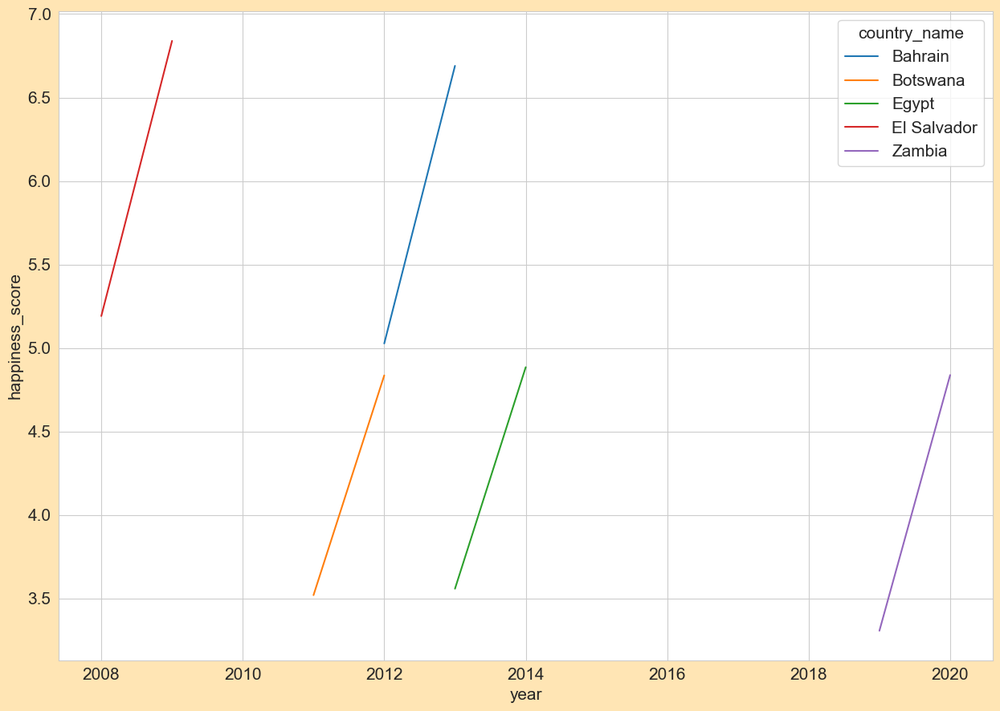

In [120]:
sns.lineplot(data=top_1year, x = 'year', y = 'happiness_score', hue  = 'country_name')

In [121]:
top_1year_countries = top_1year['country_name'].drop_duplicates().tolist()

top_1year_all = test_data_2[test_data_2['country_name'].isin(top_1year_countries)]

<Axes: xlabel='year', ylabel='happiness_score'>

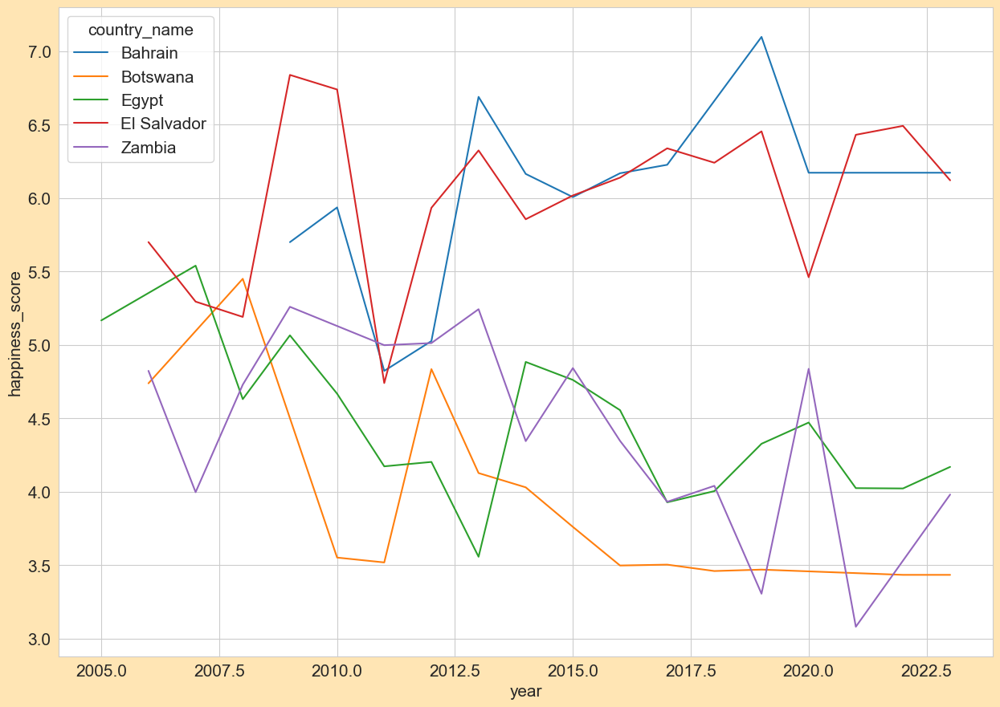

In [122]:
sns.lineplot(data=top_1year_all, x = 'year', y = 'happiness_score', hue = 'country_name')

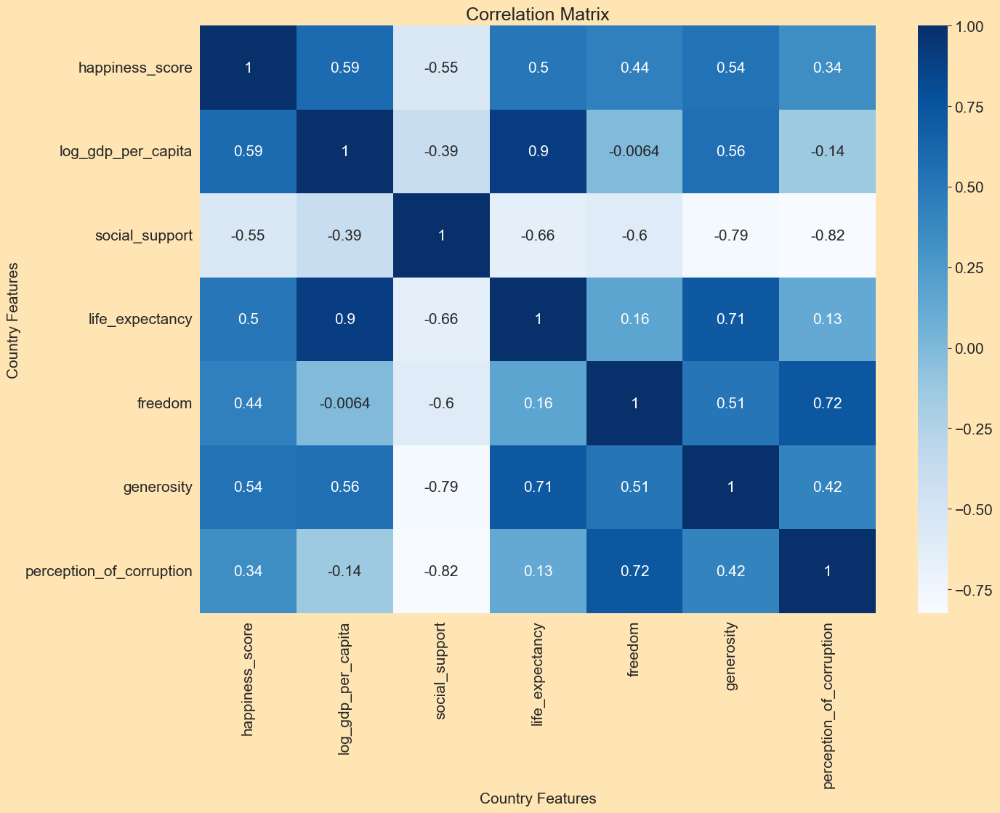

In [123]:
corr = data[data['country_name'] == 'Bahrain'].corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

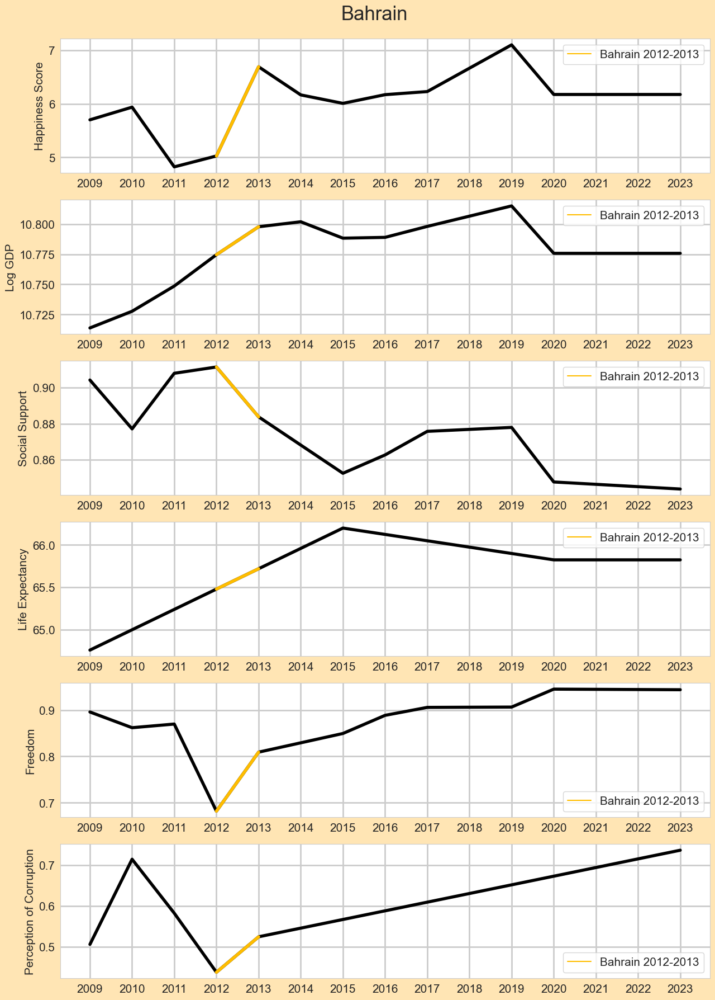

In [124]:
Bahrain_2012_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2012, 2013]) == True)]
Bahrain_2012_2013.loc[Bahrain_2012_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2012-2013'

fig, ax = plt.subplots(6, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2012_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )


sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2012_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Perception of Corruption')
ax[5].grid(linewidth=2)
ax[5].legend(title='')


In [125]:
slope = (Bahrain_2012_2013[Bahrain_2012_2013['year'] == 2013]['happiness_score'].item() - Bahrain_2012_2013[Bahrain_2012_2013['year'] == 2012]['happiness_score'].item()) / (Bahrain_2012_2013[Bahrain_2012_2013['year'] == 2013]['year'].item() - Bahrain_2012_2013[Bahrain_2012_2013['year'] == 2012]['year'].item()) 
slope

1.6625242233276367

In [126]:
Bahrain_2012_2013[Bahrain_2012_2013['year'] == 2012]['year'].item()

2012

In [127]:
Bahrain_2012_2013[Bahrain_2012_2013['year'] == 2013]['year'].item()

2013

In [128]:
# Find the difference between 2 consecutive years by country

test_data_2['diff']=test_data_2.groupby(['country_name',test_data_2['year'].diff().ne(1).cumsum()])['happiness_score'].diff(2)
test_data_2.head(20)

,country_name,year,happiness_score,diff
0,Afghanistan,2008,3.723590,NaN
1,Afghanistan,2009,4.401778,NaN
2,Afghanistan,2010,4.758381,1.034791
3,Afghanistan,2011,3.831719,-0.570059
4,Afghanistan,2012,3.782938,-0.975443
5,Afghanistan,2013,3.572100,-0.259619
6,Afghanistan,2014,3.130896,-0.652042
7,Afghanistan,2015,3.982855,0.410754
8,Afghanistan,2016,4.220169,1.089273
9,Afghanistan,2017,2.661718,-1.321136


In [129]:
top_2year_index = test_data_2.sort_values('diff', ascending = False).head(5).index.tolist()
bottom_2year_index = test_data_2.sort_values('diff', ascending = True).head(5).index.tolist()

In [130]:
a = [x - 1 for x in top_2year_index]
a

[131, 199, 1197, 818, 630]

In [131]:
b = [x - 2 for x in top_2year_index]
b

[130, 198, 1196, 817, 629]

In [132]:
top_2year_index = top_1year_index + a + b
top_2year_index.sort()
top_2year_index

[130,
 131,
 131,
 132,
 198,
 199,
 245,
 246,
 613,
 614,
 626,
 627,
 629,
 630,
 817,
 818,
 1196,
 1197,
 2314,
 2315]

In [133]:
top_2year = test_data_2.iloc[top_2year_index].reset_index().drop('index', axis=1)
top_2year

,country_name,year,happiness_score,diff
0,Bahrain,2011,4.823976,-0.876547
1,Bahrain,2012,5.027187,-0.909682
2,Bahrain,2012,5.027187,-0.909682
3,Bahrain,2013,6.689711,1.865735
4,Benin,2016,4.007358,0.659938
5,Benin,2017,4.853181,1.228517
6,Botswana,2011,3.519921,NaN
7,Botswana,2012,4.835939,1.282919
8,Egypt,2013,3.558520,-0.615638
9,Egypt,2014,4.885073,0.680916


In [134]:


top_2year['diff'] = top_2year['happiness_score'] - top_2year.groupby('country_name')['happiness_score'].shift(2)
top_2year

,country_name,year,happiness_score,diff
0,Bahrain,2011,4.823976,NaN
1,Bahrain,2012,5.027187,NaN
2,Bahrain,2012,5.027187,0.203211
3,Bahrain,2013,6.689711,1.662524
4,Benin,2016,4.007358,NaN
5,Benin,2017,4.853181,NaN
6,Botswana,2011,3.519921,NaN
7,Botswana,2012,4.835939,NaN
8,Egypt,2013,3.558520,NaN
9,Egypt,2014,4.885073,NaN


<Axes: xlabel='year', ylabel='happiness_score'>

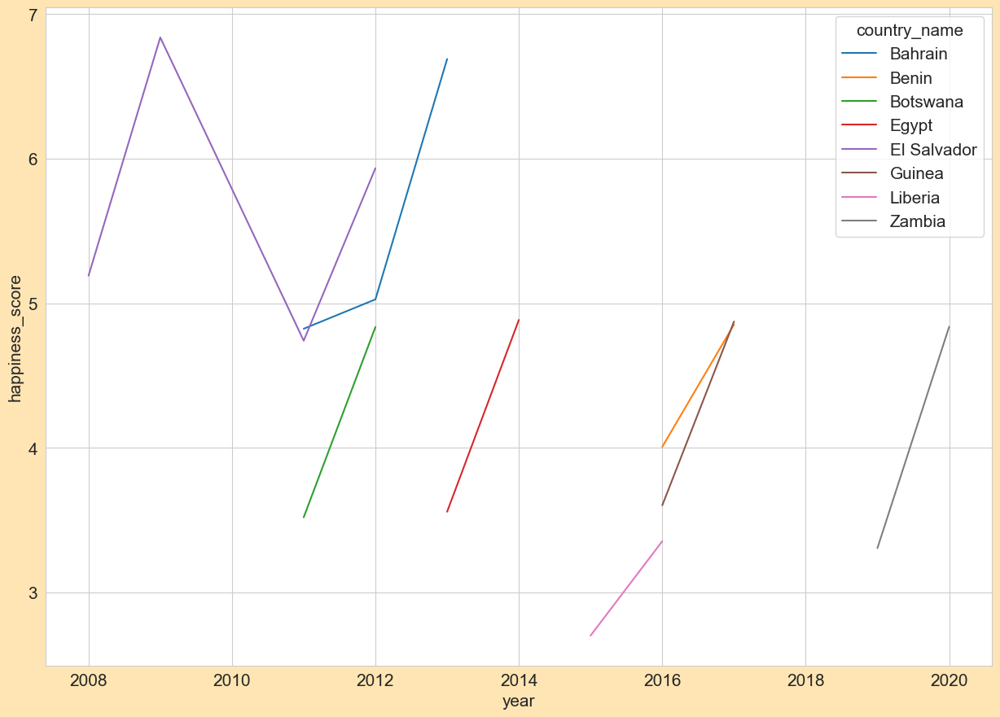

In [135]:
sns.lineplot(data=top_2year, x = 'year', y = 'happiness_score', hue  = 'country_name')

In [136]:
top_2year_countries = top_2year['country_name'].drop_duplicates().tolist()

top_2year_all = test_data_2[test_data_2['country_name'].isin(top_2year_countries)]

<Axes: xlabel='year', ylabel='happiness_score'>

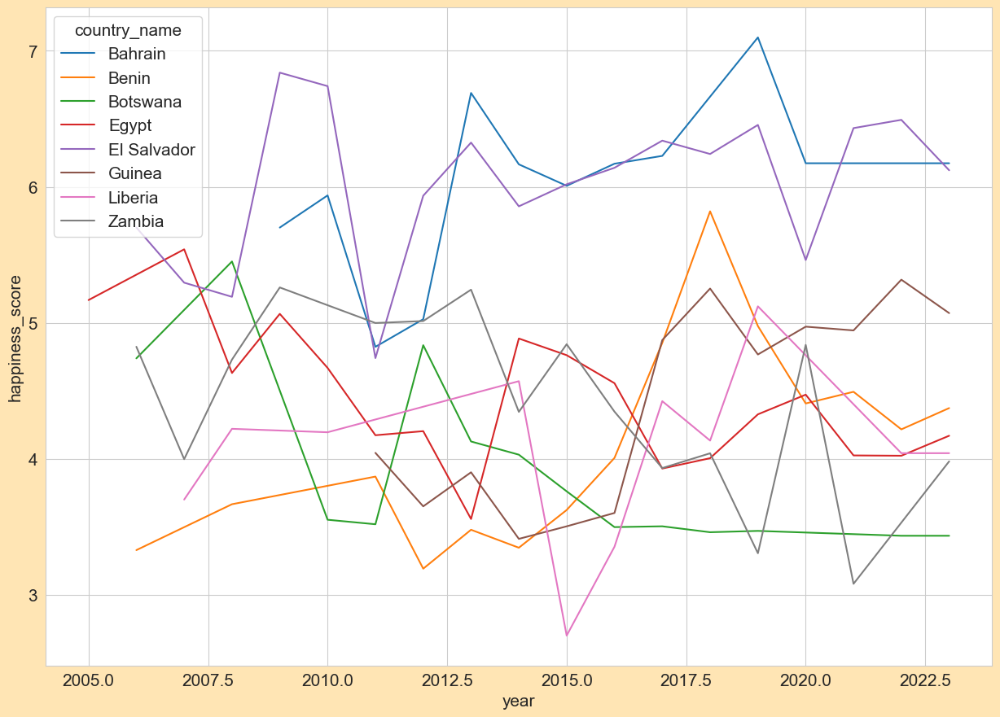

In [137]:
sns.lineplot(data=top_2year_all, x = 'year', y = 'happiness_score', hue = 'country_name')

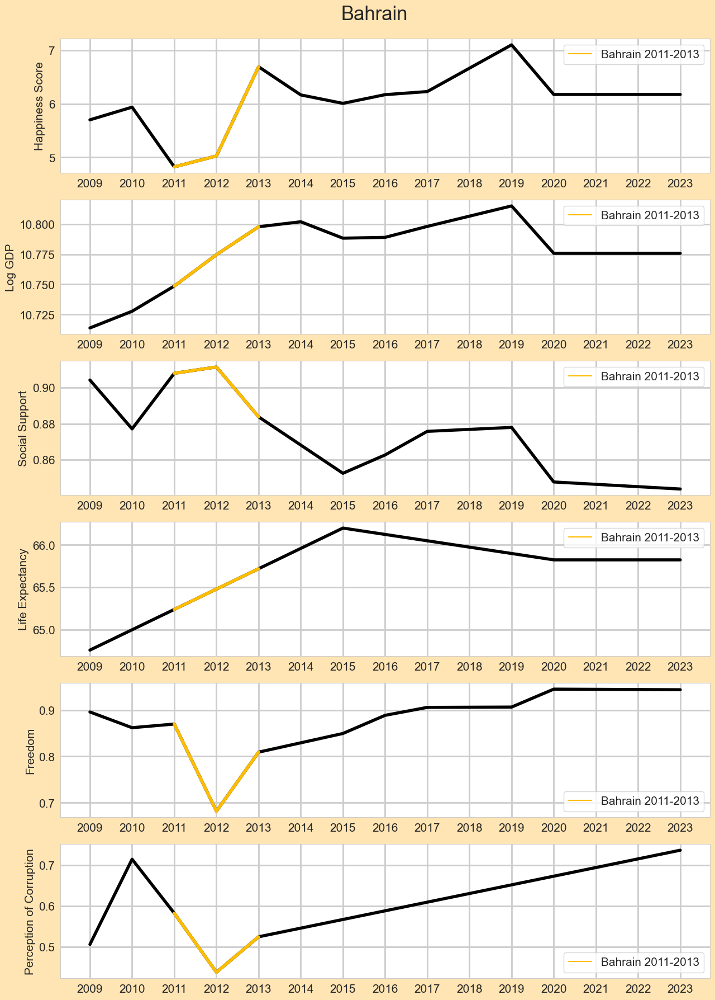

In [138]:
Bahrain_2011_2013 = data[(data['country_name'] == 'Bahrain') & (data['year'].isin([2011, 2012, 2013]) == True)]
Bahrain_2011_2013.loc[Bahrain_2011_2013['country_name'] == 'Bahrain', 'country_name'] = 'Bahrain 2011-2013'

fig, ax = plt.subplots(6, 1, figsize=(15, 20))
fig.suptitle('Bahrain', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2008]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Bahrain_2011_2013, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )


sns.lineplot(data=data[data['country_name'] == 'Bahrain'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Bahrain_2011_2013, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Perception of Corruption')
ax[5].grid(linewidth=2)
ax[5].legend(title='')

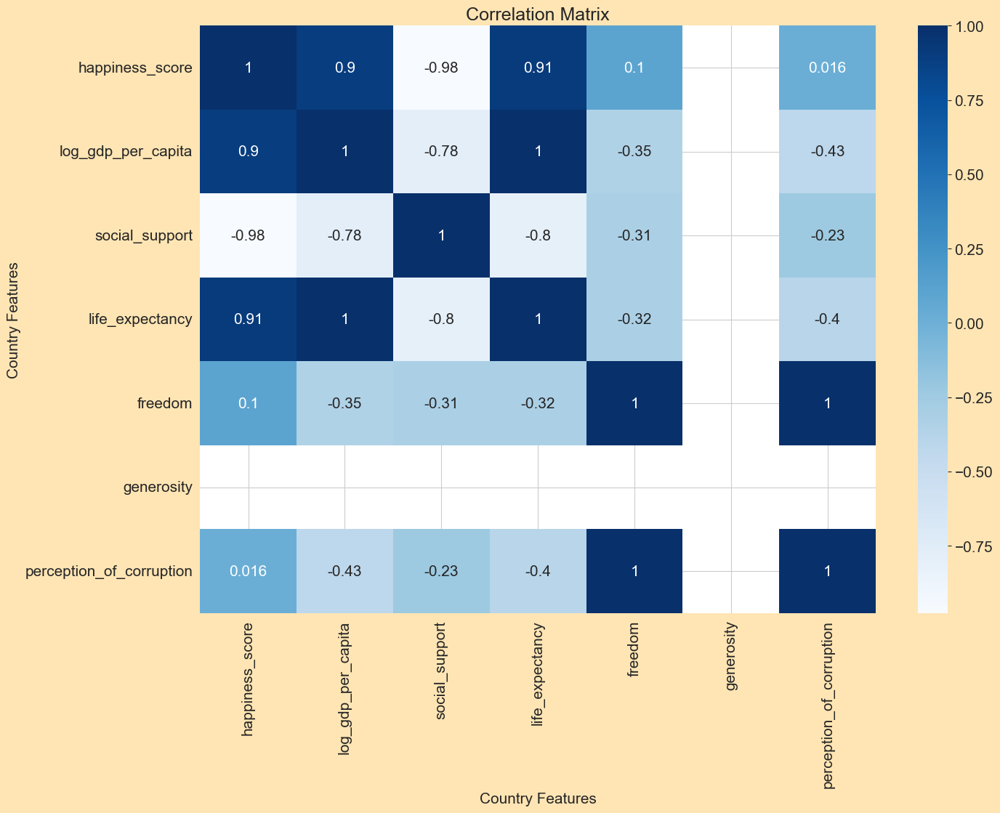

In [139]:
corr = Bahrain_2011_2013.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

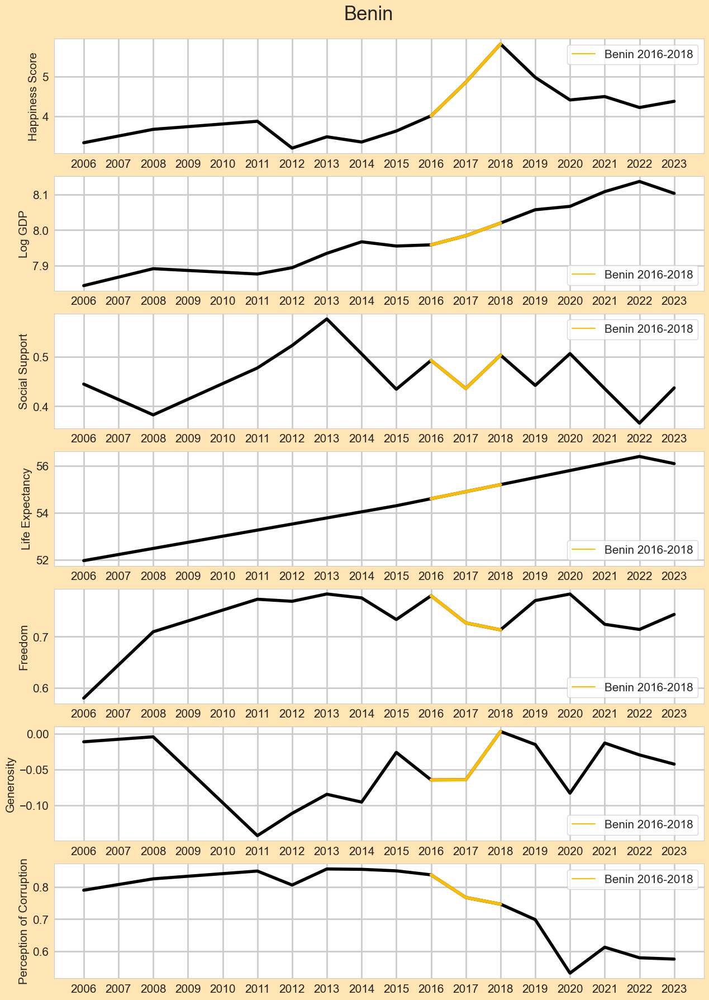

In [140]:
Benin_2016_2018 = data[(data['country_name'] == 'Benin') & (data['year'].isin([2016, 2017, 2018]) == True)]
Benin_2016_2018.loc[Benin_2016_2018['country_name'] == 'Benin', 'country_name'] = 'Benin 2016-2018'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Benin', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2005]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Benin_2016_2018, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Benin_2016_2018, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Benin_2016_2018, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Benin_2016_2018, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Benin_2016_2018, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Benin_2016_2018, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Benin'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Benin_2016_2018, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

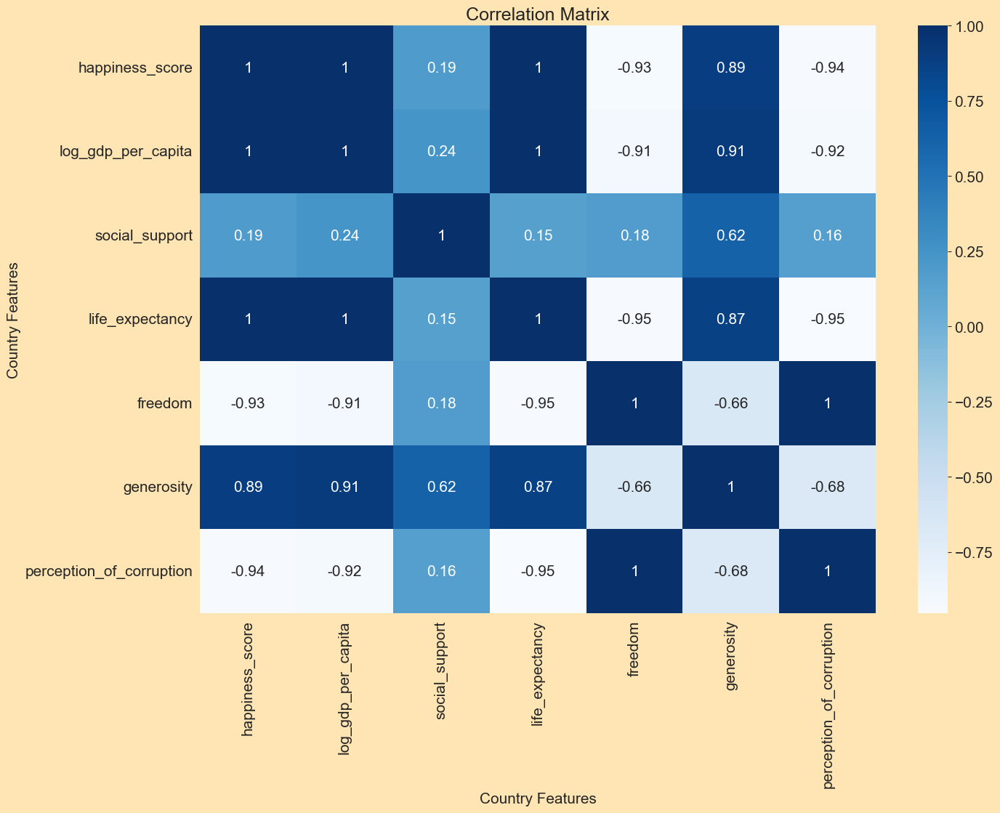

In [141]:
corr = Benin_2016_2018.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

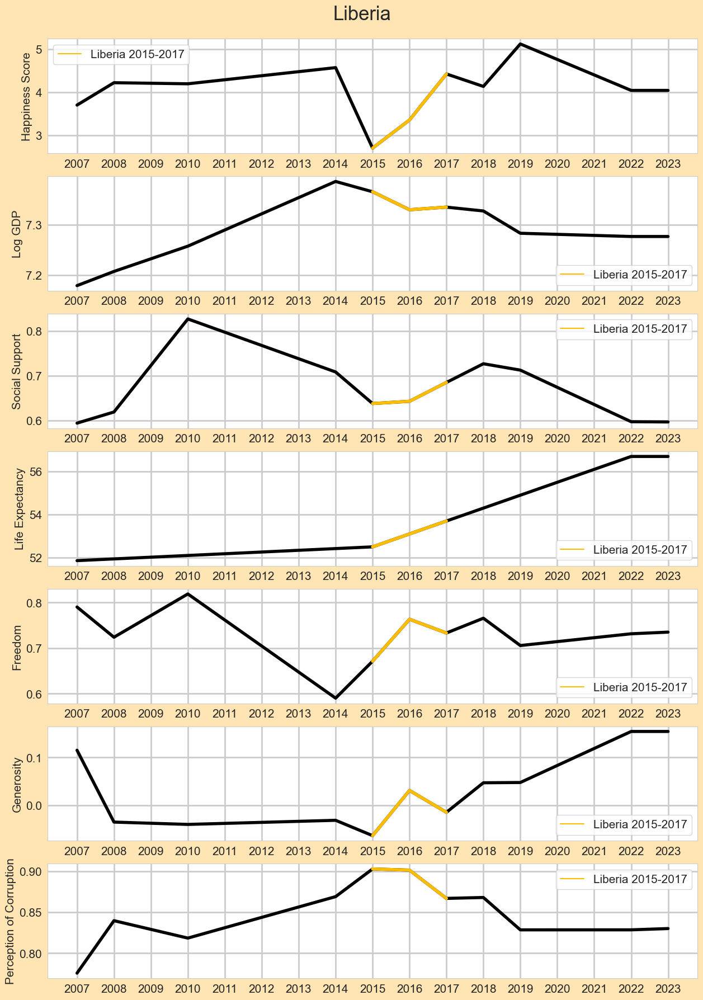

In [142]:
Liberia_2015_2017 = data[(data['country_name'] == 'Liberia') & (data['year'].isin([2015, 2016, 2017]) == True)]
Liberia_2015_2017.loc[Liberia_2015_2017['country_name'] == 'Liberia', 'country_name'] = 'Liberia 2015-2017'

fig, ax = plt.subplots(7, 1, figsize=(15, 20))
fig.suptitle('Liberia', fontsize=25)
fig.subplots_adjust(top=0.95)

years = data[data['year'] > 2006]['year'].drop_duplicates().sort_values().tolist()

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='happiness_score', linewidth=4.0, color='black', ax=ax[0])
sns.lineplot(data=Liberia_2015_2017, x='year', y='happiness_score', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[0])
ax[0].set(xticks=years)
ax[0].set_xlabel('')
ax[0].set_ylabel('Happiness Score')
ax[0].grid(linewidth=2)
ax[0].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='log_gdp_per_capita', linewidth=4.0, color='black', ax=ax[1])
sns.lineplot(data=Liberia_2015_2017, x='year', y='log_gdp_per_capita', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[1])
ax[1].set(xticks=years)
ax[1].set_xlabel('')
ax[1].set_ylabel('Log GDP')
ax[1].grid(linewidth=2)
ax[1].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='social_support', linewidth=4.0, color='black', ax=ax[2])
sns.lineplot(data=Liberia_2015_2017, x='year', y='social_support', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[2])
ax[2].set(xticks=years)
ax[2].set_xlabel('')
ax[2].set_ylabel('Social Support')
ax[2].grid(linewidth=2)
ax[2].legend(title='')

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='life_expectancy', linewidth=4.0, color='black', ax=ax[3])
sns.lineplot(data=Liberia_2015_2017, x='year', y='life_expectancy', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[3])
ax[3].set(xticks=years)
ax[3].set_xlabel('')
ax[3].set_ylabel('Life Expectancy')
ax[3].grid(linewidth=2)
ax[3].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='freedom', linewidth=4.0, color='black', ax=ax[4])
sns.lineplot(data=Liberia_2015_2017, x='year', y='freedom', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[4])
ax[4].set(xticks=years)
ax[4].set_xlabel('')
ax[4].set_ylabel('Freedom')
ax[4].grid(linewidth=2)
ax[4].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='generosity', linewidth=4.0, color='black', ax=ax[5])
sns.lineplot(data=Liberia_2015_2017, x = 'year', y = 'generosity', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[5])
ax[5].set(xticks= years)
ax[5].set_xlabel('')
ax[5].set_ylabel('Generosity')
ax[5].grid(linewidth=2)
ax[5].legend(title='', loc='lower right' )

sns.lineplot(data=data[data['country_name'] == 'Liberia'], x='year', y='perception_of_corruption', linewidth=4.0, color='black', ax=ax[6])
sns.lineplot(data=Liberia_2015_2017, x = 'year', y = 'perception_of_corruption', linewidth=4.0, hue='country_name', palette='Wistia', ax=ax[6])
ax[6].set(xticks= years)
ax[6].set_xlabel('')
ax[6].set_ylabel('Perception of Corruption')
ax[6].grid(linewidth=2)
ax[6].legend(title='')

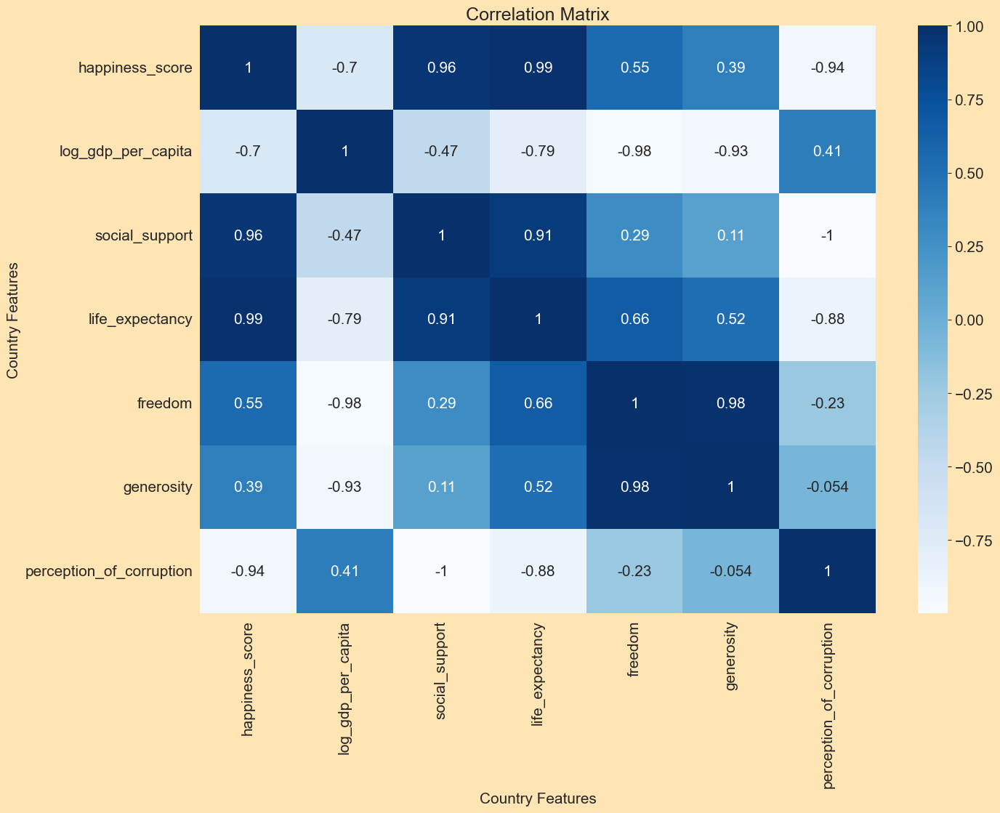

In [143]:
corr = Liberia_2015_2017.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [144]:
Liberia_2015_2017

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
1126,Liberia 2015-2017,Africa,2015,2.701591,7.365848,0.637666,52.500000,0.671431,-0.062922,0.902673
1127,Liberia 2015-2017,Africa,2016,3.354676,7.330050,0.642615,53.099998,0.763476,0.031251,0.901267
1128,Liberia 2015-2017,Africa,2017,4.424491,7.335250,0.684867,53.700001,0.733390,-0.014268,0.866806


In [145]:
Benin_2016_2018

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
188,Benin 2016-2018,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
189,Benin 2016-2018,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235
190,Benin 2016-2018,Africa,2018,5.819827,8.019668,0.503544,55.200001,0.713264,0.002967,0.746511


In [146]:
Liberia_2015_2017.append(Benin_2016_2018, ignore_index=True)

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_17396\384592147.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Liberia_2015_2017.append(Benin_2016_2018, ignore_index=True)


,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption
0,Liberia 2015-2017,Africa,2015,2.701591,7.365848,0.637666,52.500000,0.671431,-0.062922,0.902673
1,Liberia 2015-2017,Africa,2016,3.354676,7.330050,0.642615,53.099998,0.763476,0.031251,0.901267
2,Liberia 2015-2017,Africa,2017,4.424491,7.335250,0.684867,53.700001,0.733390,-0.014268,0.866806
3,Benin 2016-2018,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716
4,Benin 2016-2018,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235
5,Benin 2016-2018,Africa,2018,5.819827,8.019668,0.503544,55.200001,0.713264,0.002967,0.746511


In [147]:
top_2year

,country_name,year,happiness_score,diff
0,Bahrain,2011,4.823976,NaN
1,Bahrain,2012,5.027187,NaN
2,Bahrain,2012,5.027187,0.203211
3,Bahrain,2013,6.689711,1.662524
4,Benin,2016,4.007358,NaN
5,Benin,2017,4.853181,NaN
6,Botswana,2011,3.519921,NaN
7,Botswana,2012,4.835939,NaN
8,Egypt,2013,3.558520,NaN
9,Egypt,2014,4.885073,NaN


In [148]:
top_2year['country_year'] = top_2year["country_name"] + top_2year["year"].astype(str)
top_2year_country_year = top_2year['country_year'].to_list()

In [149]:
test_data = data

In [150]:
test_data['country_year'] =  test_data["country_name"] + test_data["year"].astype(str)
test_data

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,country_year
0,Afghanistan,Asia & Pacific,2008,3.723590,7.350416,0.450662,50.500000,0.718114,0.167652,0.881686,Afghanistan2008
1,Afghanistan,Asia & Pacific,2009,4.401778,7.508646,0.552308,50.799999,0.678896,0.190809,0.850035,Afghanistan2009
2,Afghanistan,Asia & Pacific,2010,4.758381,7.613900,0.539075,51.099998,0.600127,0.121316,0.706766,Afghanistan2010
3,Afghanistan,Asia & Pacific,2011,3.831719,7.581259,0.521104,51.400002,0.495901,0.163571,0.731109,Afghanistan2011
4,Afghanistan,Asia & Pacific,2012,3.782938,7.660506,0.520637,51.700001,0.530935,0.237588,0.775620,Afghanistan2012
5,Afghanistan,Asia & Pacific,2013,3.572100,7.680333,0.483552,52.000000,0.577955,0.062666,0.823204,Afghanistan2013
6,Afghanistan,Asia & Pacific,2014,3.130896,7.670638,0.525568,52.299999,0.508514,0.105755,0.871242,Afghanistan2014
7,Afghanistan,Asia & Pacific,2015,3.982855,7.653833,0.528597,52.599998,0.388928,0.081652,0.880638,Afghanistan2015
8,Afghanistan,Asia & Pacific,2016,4.220169,7.650370,0.559072,52.924999,0.522566,0.043916,0.793246,Afghanistan2016
9,Afghanistan,Asia & Pacific,2017,2.661718,7.647830,0.490880,53.250000,0.427011,-0.119410,0.954393,Afghanistan2017


In [151]:
top_2year_all = test_data[test_data['country_year'].isin(top_2year_country_year)]
top_2year_all

,country_name,region,year,happiness_score,log_gdp_per_capita,social_support,life_expectancy,freedom,generosity,perception_of_corruption,country_year
123,Bahrain,Arab States,2011,4.823976,10.748598,0.907868,65.239998,0.869870,-0.059403,0.582522,Bahrain2011
124,Bahrain,Arab States,2012,5.027187,10.774646,0.911350,65.480003,0.681823,NaN,0.437915,Bahrain2012
125,Bahrain,Arab States,2013,6.689711,10.797851,0.883781,65.720001,0.809206,NaN,0.524703,Bahrain2013
188,Benin,Africa,2016,4.007358,7.958364,0.492816,54.599998,0.779795,-0.064476,0.837716,Benin2016
189,Benin,Africa,2017,4.853181,7.984066,0.435879,54.900002,0.726808,-0.064271,0.767235,Benin2017
232,Botswana,Africa,2011,3.519921,9.491772,0.860028,51.040001,0.812514,-0.245455,0.816158,Botswana2011
233,Botswana,Africa,2012,4.835939,9.470853,0.836743,51.480000,0.799410,-0.194504,0.814423,Botswana2012
578,Egypt,Middle east,2013,3.558520,9.184216,0.675188,61.880001,0.473775,-0.140282,0.913228,Egypt2013
579,Egypt,Middle east,2014,4.885073,9.189521,0.618551,61.939999,0.577938,-0.125367,0.749143,Egypt2014
590,El Salvador,South/Latin America,2008,5.191494,8.918751,0.747411,64.760002,0.635648,-0.081519,0.734727,El Salvador2008


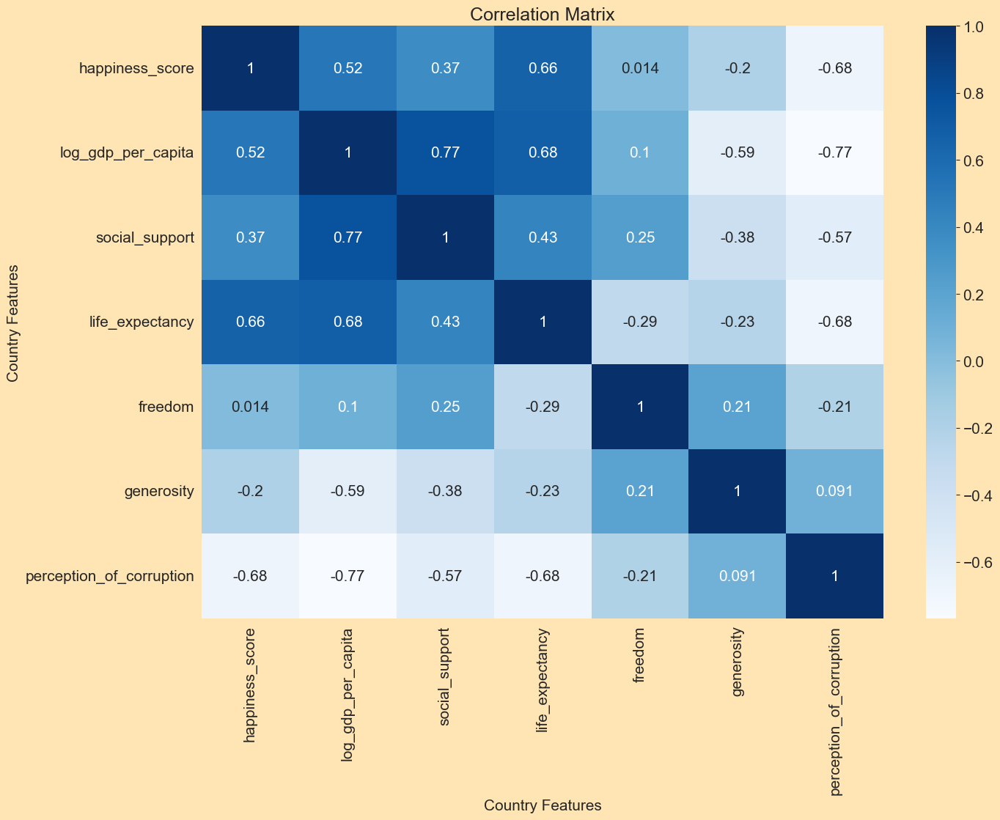

In [152]:
corr = top_2year_all.corr(numeric_only = True, method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")

plt.title('Correlation Matrix')
plt.xlabel('Country Features')
plt.ylabel('Country Features')

plt.show()

In [153]:
Beans

NameError: name 'Beans' is not defined

In [ ]:
test_data_2['previos_year'] = test_data_2.groupby('country_name')['year'].shift(1)
test_data_2 = test_data_2[['country_name', 'year', 'previos_year', 'happiness_score']]

In [ ]:
test_data_2['year_check'] = test_data_2['previos_year'].combine_first(test_data_2['year'])

In [ ]:
test_data_2['year_check_2'] = test_data_2['year'] - test_data_2['year_check']

In [ ]:
test_data_2[~test_data_2['year_check_2'].isin([0,1])]

In [ ]:
test_data_2

In [ ]:
test_data_2['year_check_3'] = np.where(test_data_2['year_check_2'].isin([0,1]), 1, test_data_2['year_check_2'] )

In [ ]:
test_data_2['happiness_score_lag'] = test_data_2.groupby(['country_name','year_check_3'])['happiness_score'].shift(1)

In [ ]:
test_data_2 = test_data_2[['country_name', 'year', 'previos_year', 'year_check', 'year_check_2', 'year_check_3', 'happiness_score', 'happiness_score_lag']]

In [ ]:
test_data_2['happiness_score_diff_1_year'] = test_data_2['happiness_score'] - test_data_2['happiness_score_lag']

In [ ]:
test_data_3 = test_data_2[['country_name', 'year', 'happiness_score_diff_1_year']]
test_data_2

In [ ]:
test_data_3

In [ ]:
Beans

In [ ]:
# ASKING STACK

In [ ]:
test_data_2 = test_data_2.reset_index().drop('index', axis = 1)
test_data_2

In [ ]:
test_data_2 = test_data_2.loc[[9,10,11,12,13,14,15,16,17]].reset_index().drop('index', axis = 1)

In [ ]:
test_data_2['happiness_score'].tolist()

In [ ]:
data = {
    'country_name' : ['Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Albania', 'Albania', 'Albania'],
    'year' : [2017, 2018, 2019, 2021, 2022, 2023, 2007, 2009, 2010],
    'score' : [2.6617181301116943, 2.694303274154663, 2.375091791152954, 2.4360344409942627, 1.2812711000442505, 1.8589999675750732, 4.634251594543457, 5.485469818115234, 5.268936634063721],
    'diff' : [np.NaN, 0.032585, -0.319211, np.NaN, -1.154763, 0.577729, np.NaN, np.NaN, -0.216533]}
df = pd.DataFrame(data)
df

In [ ]:
data = {
    'country_name' : ['Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Albania', 'Albania', 'Albania'],
    'year' : [2017, 2018, 2019, 2021, 2022, 2023, 2007, 2009, 2010],
    'score' : [2.6617181301116943, 2.694303274154663, 2.375091791152954, 2.4360344409942627, 1.2812711000442505, 1.8589999675750732, 4.634251594543457, 5.485469818115234, 5.268936634063721]}
df = pd.DataFrame(data)
df

In [ ]:
test_data_3 = test_data.groupby('year')['happiness_score'].count().reset_index()

In [ ]:
test_data_2 = test_data[['country_name', 'year','happiness_score']]
test_data_2 = test_data_2.pivot(index = 'year', columns = 'country_name')
test_data_2 

In [ ]:
distinct_countries = test_data['country_name'].drop_duplicates().sort_values().reset_index().drop('index', axis=1)['country_name'].tolist()
distinct_countries

In [ ]:
test_data_2.plot()
plt.legend(title='State', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [ ]:
#Find top 5 and bottom 5 growth quickest 

test_data_2 = data

In [ ]:
test_data_2[test_data_2['country_name'] == 'United States']

In [ ]:
# distinct_years = test_data['year'].reset_index().drop('index', axis=1).drop_duplicates().sort_values('year').reset_index().drop('index', axis=1)
distinct_years = test_data['year'].drop_duplicates().sort_values().reset_index().drop('index', axis=1)
distinct_years

In [ ]:
distinct_countries = test_data['country_name'].drop_duplicates().sort_values().reset_index().drop('index', axis=1)
distinct_countries = distinct_countries['country_name'].tolist()
len(distinct_countries)

In [ ]:
test_data_3 = distinct_years
test_data_3[distinct_countries] = np.nan
test_data_3

In [ ]:
merge = pd.merge(test_data_3, test_data_2, how = 'left', on = 'year')
merge

In [ ]:
merge.groupby('year')[]

In [ ]:
test_data_2 = test_data[['country_name',
                         'year',
                         'happiness_score']]
test_data_2 = test_data_2.head(28)
test_data_2

In [ ]:
country_name_data = test_data_2.country_name.tolist()
country_name_data

In [ ]:

year_data= test_data_2.year.tolist()
year_data

In [ ]:
happiness_score_data= test_data_2.happiness_score.tolist()
happiness_score_data

In [ ]:
data = {
'country_name': ['Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Afghanistan', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania', 'Albania'], 
'year': [2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2021, 2022, 2007, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021], 
'happiness_score' :[3.7235898971557617, 4.401778221130371, 4.758380889892578, 3.831719160079956, 3.782937526702881, 3.5721004009246826, 3.1308956146240234, 3.9828546047210693, 4.220168590545654, 2.6617181301116943, 2.694303274154663, 2.375091791152954, 2.4360344409942627, 1.2812711000442505, 4.634251594543457, 5.485469818115234, 5.268936634063721, 5.867421627044678, 5.510124206542969, 4.550647735595703, 4.81376314163208, 4.6066508293151855, 4.511100769042969, 4.639548301696777, 5.0044026374816895, 4.9953179359436035, 5.364909648895264, 5.255481719970703]} 
df = pd.DataFrame(data)
df

In [ ]:
distinct_years = df['year'].drop_duplicates().sort_values().reset_index().drop('index', axis=1)
distinct_countries = df['country_name'].drop_duplicates().sort_values().reset_index().drop('index', axis=1)['country_name'].tolist()
df_2 = distinct_years
df_2[distinct_countries] = np.nan
df_2

In [ ]:
df_2 = distinct_years
df_2[distinct_countries] = np.nan
df_2

In [ ]:
df_out = pd.pivot(test_data_2, index='year', columns="country_name", values="happiness_score")
df_out.reset_index()

In [ ]:
%qtconsole

In [ ]:
# Plot happiness_score and log_gdp_per_capita
figsize=(15, 15)
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
ax = happ_gdp_corr = sns.scatterplot(x = data.happiness_score,
                                     y = data.log_gdp_per_capita, 
                                     hue_order = ['Europe',
                                                  'Africa',
                                                  'Asia & Pacific',
                                                  'South/Latin America',
                                                  'Middle east',
                                                  'Arab States',
                                                  'North America',
                                                  'South/Central America'], 
                                     hue = data['region'], 
                                     s = 250)
sns.regplot(data=data_2023, 
            x="happiness_score",
            y="log_gdp_per_capita",
            scatter=False, 
            line_kws={"color": "black"}, 
            ax=ax)

plt.legend(loc = 'upper left',
           fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('Log GDP per Capita')

In [ ]:
test_gdp = data[data['country_name'] == 'United States']['log_gdp_per_capita']
test_happiness_score_united_states = data[data['country_name'] == 'United States']['happiness_score']
test_happiness_score_rawanda = data[data['country_name'] == 'Rawanda']['happiness_score']


In [ ]:
sns.lineplot(x = data.year, 
             y = test_gdp)


In [ ]:
test_dgp_year = data[data['country_name'] == 'United States']['year']

In [ ]:
sns.lineplot(x=test_dgp_year,
            y)

In [ ]:
data_preproc = pd.DataFrame({'year': data.year, 
                            'rawanda': test_happiness_score_rawanda,
                            'united_states': test_happiness_score_united_states})
data_preproc

In [ ]:

data_preproc = pd.DataFrame({
    'year': data.year, 
    'A': np.random.randn(num_rows).cumsum(),
    'B': np.random.randn(num_rows).cumsum(),
    'C': np.random.randn(num_rows).cumsum(),
    'D': np.random.randn(num_rows).cumsum()})

sns.lineplot(x='Year', y='value', hue='variable', 
             data=pd.melt(data_preproc, ['Year']))

In [ ]:
Beans STraight up

In [ ]:
data = pd.read_excel(r"C:\Users\Olimpio Chris Campos\Desktop\Global Happiness\2021\DataForFigure2.1WHR2021C2.xls")

In [ ]:
data.head(5)

In [ ]:
data_columns = ['Country name','Regional indicator','Ladder score', 'Logged GDP per capita', 'Social support', 'Healthy life expectancy', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption']
data_columns

In [ ]:
data = data[data_columns]
data

In [ ]:
happy_df_2021 = data.rename(columns = {'Country name':'country_name', 'Regional indicator':'region', 'Ladder score':'happiness_score', 'Logged GDP per capita':'logged_gdp_per_capita', 'Social support':'social_support', 'Healthy life expectancy':'health_life_expectancy', 'Freedom to make life choices':'freedom', 'Generosity':'generosity', 'Perceptions of corruption':'perception_of_corruption'})
happy_df_2021

In [ ]:
# Check Nulls

happy_df_2021.isnull().sum()

In [ ]:
# Plot happiness_score and logged_gdp_per_capita

plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Happiness vs GDP')
sns.scatterplot(x = happy_df_2021.happiness_score, y = happy_df_2021.logged_gdp_per_capita, hue = happy_df_2021.region, s = 500);

plt.legend(loc = 'upper left', fontsize = '13')
plt.xlabel('Happiness Score')
plt.ylabel('GDP per Capita')

In [ ]:
gdp_region = happy_df_2021.groupby('region')['logged_gdp_per_capita'].sum()
gdp_region

In [ ]:
gdp_region.plot.pie(autopct = '%1.1f%%')
plt.title('GDP by Region')
plt.ylabel('')

In [ ]:
#  Total Coutntries

total_country = happy_df_2021.groupby('region')[['country_name']].count().rename(columns = {'country_name':'n_countries'}).sort_values('n_countries', ascending=False)
print(total_country)

In [ ]:
corr = happy_df_2021.corr(method = "pearson")
sns.heatmap(corr, annot=True, cmap="Blues")
plt.show()

In [ ]:
# corruption in regions

corruption_index = happy_df_2021.groupby('region')['perception_of_corruption'].mean()
corruption_index

In [ ]:
plt.rcParams['figure.figsize'] = (15,10.5)
plt.title('Perception of Corruption by Region')

plt.legend(loc = 'upper left', fontsize = '13')
plt.xlabel('Region')
plt.ylabel('Corruption Index')
plt.xticks(rotation = 30, ha = 'right')
plt.bar(corruption.index, corruption_index)

In [ ]:
happy_df_2021.sort_values('happiness_score', ascending=False).head(10)
happy_df_2021.sort_values('happiness_score', ascending=False).tail(10)

In [ ]:
%whos DataFrame